# **Ocean Mixing Story Group 1**

## Background 
The ocean plays a crucial role in the global carbon cycle by absorbing atmospheric CO₂, having absorbed 38% of all anthropogenic fossil fuel emissions over the industrial era. 

Accurate estimation of air–sea CO₂ flux is critical for understanding the current and future global carbon budget, yet remains challenging due to the sparse and unevenly distributed nature of surface ocean pCO₂ observations. The **Surface Ocean CO₂ Atlas (SOCAT)** database (https://socat.info/) provides the most extensive dataset available, but its coverage is limited to only about 2% of all boxes of 1 degree X 1 degree (= 100km X 100km at the equator) over the last several decades. Data are particularly limited in high-latitude regions and during winter months.

To fill in the gaps in these data, statistical and machine learning (ML) techniques have been widely used to reconstruct global pCO₂ fields by interpolating between observations using environmental predictors such as sea surface temperature (SST), sea surface salinity (SSS), mixed layer depth (MLD), chlorophyll-a (Chl-a), and atmospheric CO₂ (xCO₂).

## How good are these methods? 

This project has two goals:
**Determine the statistical confidance and variability of the pCO₂ reconstructions across the globe** 
**Investigate how adding more observations affects statistical confidence and variability**

Results from this investigation will help answer whether adding data will improve the confidence of the models generally. Going a step deeper, this investigation can give insight into whether it is more important to add more observations in locations historically sampled, or in locations not in the database. Relatedly, this research can inform which areas of the globe are most important to direct funding towards sampling, or to focus other statistical technique to improve model confidence. 

By gaining more confidence in pCO2 reconstructions, scientists can more accurately answer questions related to carbon budgets and other scientific and socio-economic questions related to climate change. 

## Information about the ML model used

## Information about Adding Observations

In section 2, there is an investigation of how adding data to the model affects statistical confidence and variability. In particular, we investigate adding data across 2 dimensions:

1. Adding more observations at locations that have historically been sampled. 
2. Adding new locations, not previously sampled for pCO2 concentrations.

For adding more observations to locations that have historically been sampled, chose to do XXXX(add later depending on what works)

In particular, this research will focus on adding samples to 4 Ocean Basins undersampled in the research: Southern Ocean, Indian Ocean, Arctic Areas, and Pacific Ocean between Australia and South America.  

In [1]:
your_username = 'azamkhan99'  # username of the person running the code. Reviewers should also change this to their own username.

#To allow the reviewer to access the saved files, provide notebook owner's username here:  
owner_username = 'azamkhan99'  # Reviewer should not change this name

## 0. Setup Workspace and Import Packages
We use %%capture to suppress output and keep the notebook clean. However, feel free to remove it if you want to check warnings or logs.


In [2]:
%%capture
!pip install tensorflow
!pip install keras

In [3]:
%%capture
### standard imports ###
import numpy as np
import pandas as pd
import xarray as xr
import gcsfs
### Python file with supporting functions ###
# standard imports
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
import sys
# Redirect all low-level stderr output
sys.stderr = open(os.devnull, 'w')

import datetime
from collections import defaultdict
import random
import matplotlib.pyplot as plt
pd.set_option('display.max_colwidth',100)
import csv
import cmocean as cm

# machine learning libraries
import xgboost as xgb     
from xgboost import XGBRegressor

# Change to the parent directory of the current working directory. (Run only once—otherwise it will keep moving up the directory tree)
os.chdir(os.path.dirname(os.getcwd()))
print("Current working directory:", os.getcwd())

# Python file with supporting functions
import lib.residual_utils as supporting_functions
from lib.visualization import *
from lib.bias_figure2 import concat_datasets, XarrayEvaluator
from lib.corr_figure3 import eval_spatial


In [4]:
### Setting the date range to unify the date type ###

# Define date range
date_range_start = '2004-01-01T00:00:00.000000000'
date_range_end = '2023-12-31T00:00:00.000000000'

# create date vector, adds 14 days to start & end
dates = pd.date_range(start=date_range_start, 
                      end=date_range_end,freq='MS')


init_date = str(dates[0].year) + format(dates[0].month,'02d')
fin_date = str(dates[-1].year) + format(dates[-1].month,'02d')

# 1. Surface ocean pCO2: A sparse data challenge

## SOCAT Sampling Mask Variants

This notebook investigates how different sampling strategies affect the statistical confidence of pCO₂ reconstructions. The following variants of the SOCAT mask are used:

---

### 🔹 Original Mask

- **`socat_mask_data`**  
  The baseline SOCAT sampling mask, showing where and when surface ocean pCO₂ has been measured.

---

Here, we visualize all SOCAT data for the period selected for this analysis (default is 2004-2023). 

We plot the total number of months of available data at each 1 degree X 1 degree location (100x100km at the equator). 

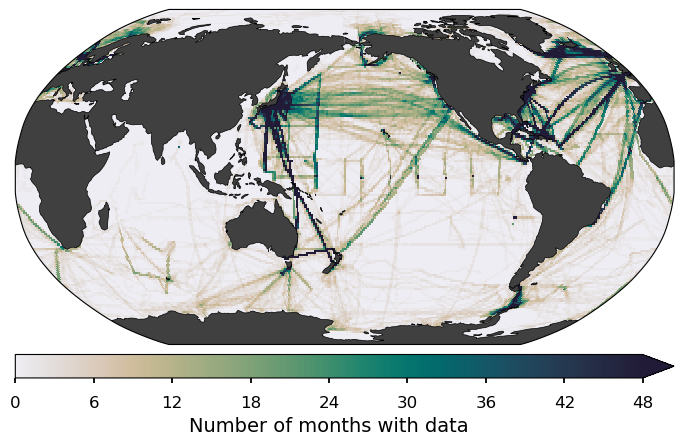

In [5]:
zarr_dir = 'gs://leap-persistent/abbysh/zarr_files_'
socat_path = f"{zarr_dir}/socat_mask_feb1982-dec2023.zarr"
socat_mask_data = xr.open_zarr(socat_path).sel(time=slice(str(dates[0]),str(dates[-1])))

non_zero_counts = (socat_mask_data.socat_mask != 0).sum(dim="time")
plot_style = "seaborn-v0_8-talk"

with plt.style.context(plot_style):
    fig = plt.figure(figsize=(8.5, 11)) # fig = plt.figure(dpi=300)
    worldmap = SpatialMap2(fig=fig, region='world', 
                   cbar_mode='each',
                   colorbar=True,
                   cbar_location='bottom',
                   nrows_ncols=[1,1])
    
    vrange = [0, 48, 6]
    cmap = cm.cm.rain
    data = xr_add_cyclic_point(non_zero_counts, cyclic_coord='xlon')
    data = data.assign_coords(xlon=(((data.xlon + 180) % 360) ))
    sub = worldmap.add_plot(lon=data['xlon'], lat=data['ylat'], data=data, 
                      vrange=vrange[0:2], cmap=cmap, ax=0, linewidth_coast=0.5)
    
    col = worldmap.add_colorbar(sub, ax=0,extend='max')
    worldmap.set_cbar_xlabel(col, 'Number of months with data', fontsize=14)
    worldmap.set_ticks(col, vrange[0], vrange[1], vrange[2])
    col.ax.tick_params(labelsize=12)
    plt.show()

In [6]:
#socat_mask_data.where(non_zero_counts == 0, socat_mask_data.max(dim='ylat'))
indices = non_zero_counts.where(non_zero_counts == 5).coords
index_list = list(zip(indices['xlon'].values, indices['ylat'].values))
#print(index_list[0])
#-179.5, -89.5
index_list[50][1]
#non_zero_counts.sel(xlon = -179.5, ylat = -89.5).values
test = non_zero_counts.where(non_zero_counts == 5)
test[14][7]

socat_mask_data.sel(xlon = -172.5, ylat = -75.5).values

<bound method Mapping.values of <xarray.Dataset> Size: 4kB
Dimensions:     (time: 240)
Coordinates:
  * time        (time) datetime64[ns] 2kB 2004-01-01 2004-02-01 ... 2023-12-01
    xlon        float64 8B -172.5
    ylat        float64 8B -75.5
Data variables:
    socat_mask  (time) float64 2kB dask.array<chunksize=(52,), meta=np.ndarray>>

In [7]:
socat_mask_data

<xarray.Dataset> Size: 124MB
Dimensions:     (time: 240, ylat: 180, xlon: 360)
Coordinates:
  * time        (time) datetime64[ns] 2kB 2004-01-01 2004-02-01 ... 2023-12-01
  * xlon        (xlon) float64 3kB -179.5 -178.5 -177.5 ... 177.5 178.5 179.5
  * ylat        (ylat) float64 1kB -89.5 -88.5 -87.5 -86.5 ... 87.5 88.5 89.5
Data variables:
    socat_mask  (time, ylat, xlon) float64 124MB dask.array<chunksize=(52, 45, 90), meta=np.ndarray>

In [8]:
#non_zero_counts.sum().item()
#287,121 instances
socat_mask_data.sum()

<xarray.Dataset> Size: 8B
Dimensions:     ()
Data variables:
    socat_mask  float64 8B dask.array<chunksize=(), meta=np.ndarray>

In [7]:
def plot_mask(mask, title):
    with plt.style.context(plot_style):
        fig = plt.figure(figsize=(8.5, 11)) # fig = plt.figure(dpi=300)
        worldmap = SpatialMap2(fig=fig, region='world', 
                    cbar_mode='each',
                    colorbar=True,
                    cbar_location='bottom',
                    nrows_ncols=[1,1])
        
        vrange = [0, 144, 12]
        cmap = cm.cm.rain
        data = xr_add_cyclic_point(mask, cyclic_coord='xlon')
        data = data.assign_coords(xlon=(((data.xlon + 180) % 360) ))
        sub = worldmap.add_plot(lon=data['xlon'], lat=data['ylat'], data=data, 
                        vrange=vrange[0:2], cmap=cmap, ax=0, linewidth_coast=0.5)
        
        col = worldmap.add_colorbar(sub, ax=0,extend='max')
        worldmap.set_cbar_xlabel(col, 'Number of months with data', fontsize=14)
        worldmap.set_ticks(col, vrange[0], vrange[1], vrange[2])
        col.ax.tick_params(labelsize=12)
        worldmap.set_title(title, ax=0, fontsize=14)
        plt.show()
        # save figure
        fig.savefig(f"mask_{title}.png", dpi=300, bbox_inches='tight')


## Adding More Locations

### 🔸 Augmenting Existing Sampled Locations

These variants **increase the number of samples at already-sampled locations** without changing the spatial coverage.

- **`socat_mean_glob`**  
  Boosts under-sampled locations (below global mean) to the global mean number of sampling months.

- **`socat_30p_glob`**  
  Ensures all existing sampled grid cells have at least 7 months of data (≈30% increase).

- **`socat_50p_glob`**  
  Ensures all existing sampled grid cells have at least 10 months of data (≈50% increase).

---

In [8]:
# if there's real world data sampled at the location, say it's sampled more
# no change in distribution of sampling
mean_val_glob_loc = non_zero_counts.where(
    (non_zero_counts > non_zero_counts.mean()) | (non_zero_counts == 0), 5
)
socat_mean_glob = socat_mask_data.where(
    (non_zero_counts > non_zero_counts.mean()) | (non_zero_counts == 0),
    socat_mask_data.sel(xlon=-172.5, ylat=-75.5),
)

thirtyp_val_glob = non_zero_counts.where(
    (non_zero_counts > 7) | (non_zero_counts == 0), 7
)
socat_30p_glob = socat_mask_data.where(
    (non_zero_counts > 7) | (non_zero_counts == 0),
    socat_mask_data.sel(xlon=171.5, ylat=-39.5),
)
fiftyp_val_glob = non_zero_counts.where(
    (non_zero_counts > 10) | (non_zero_counts == 0), 10
)
socat_50p_glob = socat_mask_data.where(
    (non_zero_counts > 9) | (non_zero_counts == 0),
    socat_mask_data.sel(xlon=132.5, ylat=-54.5),
)


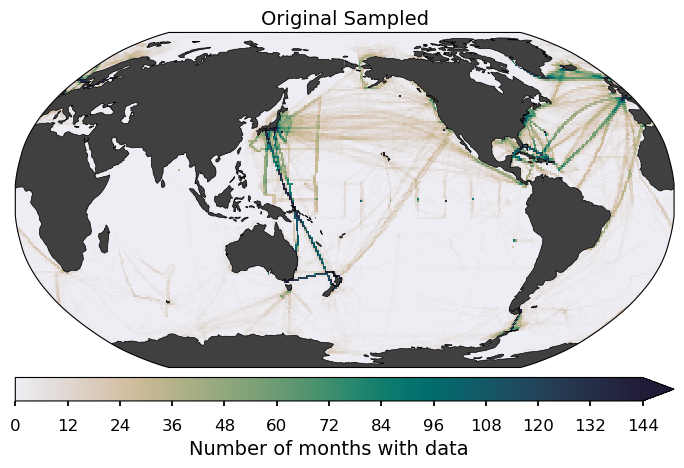

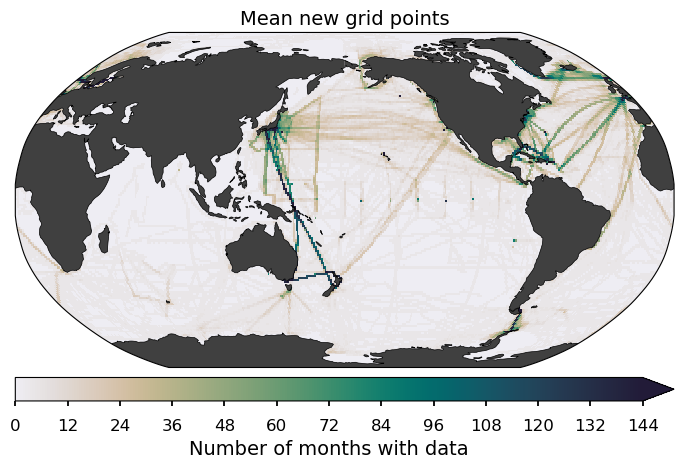

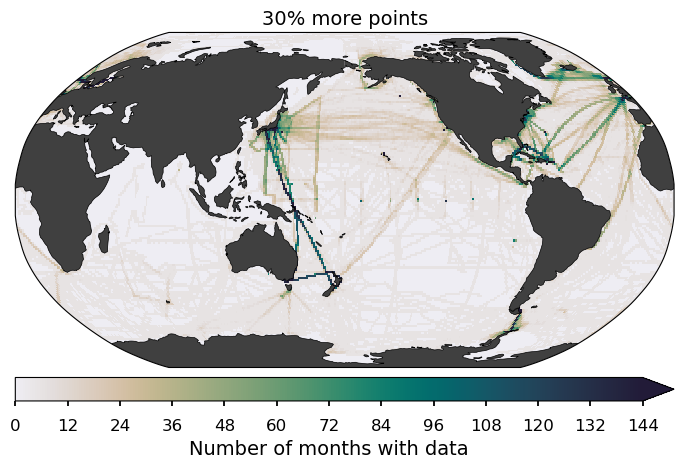

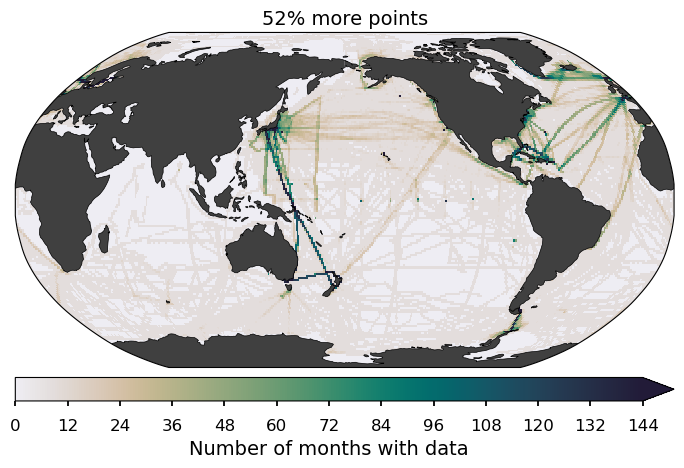

In [ ]:
plot_mask(non_zero_counts, "Original Sampled")
plot_mask(mean_val_glob_loc, "Mean new grid points")
plot_mask(thirtyp_val_glob, "30% more points")
plot_mask(fiftyp_val_glob, "52% more points")


### 🔸 Adding New Sample Locations

These variants **expand the spatial footprint** by adding sampling at new locations in undersampled ocean regions.

- **`addmeanp_socat`**  
  Adds ~14% new grid points in each of the three undersampled basins, sampled at the global mean frequency.

- **`add30p_socat`**  
  Adds 100 new grid points per basin, each with moderate sampling (~7 months).

- **`add50p_socat`**  
  Adds 200 new grid points per basin, each with higher sampling (~10 months).

---

<table style="border-collapse: collapse; width: 100%;">
  <tr>
    <th style="border: 1px solid black;">Region</th>
    <th style="border: 1px solid black;">Latitude Range</th>
    <th style="border: 1px solid black;">Longitude Range</th>
  </tr>
  <tr>
    <td style="border: 1px solid black;">Pacific 1</td>
    <td style="border: 1px solid black;">-46 to -36</td>
    <td style="border: 1px solid black;">-97 to -87</td>
  </tr>
  <tr>
    <td style="border: 1px solid black;">Pacific 2</td>
    <td style="border: 1px solid black;">-45 to -35</td>
    <td style="border: 1px solid black;">-130 to -110</td>
  </tr>
  <tr>
    <td style="border: 1px solid black;">Pacific 3</td>
    <td style="border: 1px solid black;">-32 to -27</td>
    <td style="border: 1px solid black;">-141 to -121</td>
  </tr>
  <tr>
    <td style="border: 1px solid black;">Southern Ocean</td>
    <td style="border: 1px solid black;">-90 to -70</td>
    <td style="border: 1px solid black;">90 to 110</td>
  </tr>
  <tr>
    <td style="border: 1px solid black;">Indian Ocean 1</td>
    <td style="border: 1px solid black;">-11 to 9</td>
    <td style="border: 1px solid black;">75 to 85</td>
  </tr>
  <tr>
    <td style="border: 1px solid black;">Indian Ocean 2</td>
    <td style="border: 1px solid black;">-30 to -25</td>
    <td style="border: 1px solid black;">70 to 90</td>
  </tr>
</table>

In [9]:
addmeanp_oceans = non_zero_counts.copy(deep=True)
addmeanp_socat = socat_mask_data.copy(deep=True)


addmeanp_oceans.loc[dict(xlon=slice(-97, -87), ylat=slice(-46, -36))] = 34  # Pacific 1
addmeanp_oceans.loc[dict(xlon=slice(-130, -110), ylat=slice(-45, -35))] = 34  # Pacific 2
addmeanp_oceans.loc[dict(xlon=slice(-141, -121), ylat=slice(-32, -27))] = 34  # Pacific 3
addmeanp_oceans.loc[dict(xlon=slice(90, 110), ylat=slice(-90, -70))] = 34  # Southern Ocean
addmeanp_oceans.loc[dict(xlon=slice(75, 85), ylat=slice(-11, 9))] = 33  # Indian Ocean 1
addmeanp_oceans.loc[dict(xlon=slice(70, 90), ylat=slice(-30, -25))] = 33  # Indian Ocean 2

ref_val1 = socat_mask_data["socat_mask"].sel(xlon=-11.5, ylat=40.5)
ref_val2 = socat_mask_data["socat_mask"].sel(xlon=154.5, ylat=43.5)

addmeanp_socat["socat_mask"].loc[dict(ylat=slice(-46, -36), xlon=slice(-97, -87))] = ref_val1
addmeanp_socat["socat_mask"].loc[dict(ylat=slice(-45, -35), xlon=slice(-130, -120))] = ref_val1
addmeanp_socat["socat_mask"].loc[dict(ylat=slice(-32, -27), xlon=slice(-141, -121))] = ref_val1
addmeanp_socat["socat_mask"].loc[dict(ylat=slice(-90, -70), xlon=slice(90, 110))] = ref_val1

addmeanp_socat["socat_mask"].loc[dict(ylat=slice(-11, 9), xlon=slice(75, 85))] = ref_val2
addmeanp_socat["socat_mask"].loc[dict(ylat=slice(-30, -25), xlon=slice(70, 90))] = ref_val2

In [10]:
# Adding 30% more values to undersampled oceans, in currently unsampled locations
add30p_oceans = non_zero_counts.copy(deep=True)
add30p_socat = socat_mask_data.copy(deep=True)
add30p_oceans.loc[dict(xlon=slice(-97, -87), ylat=slice(-46, -36))] = 73  # pacific1
add30p_oceans.loc[dict(xlon=slice(-130, -110), ylat=slice(-45, -35))] = 73  # pacific2
add30p_oceans.loc[dict(xlon=slice(-141, -121), ylat=slice(-32, -27))] = 73  # pacific3
add30p_oceans.loc[dict(xlon=slice(90, 110), ylat=slice(-90, -70))] = 73  # southern ocean

add30p_oceans.loc[dict(xlon=slice(75, 85), ylat=slice(-11, 9))] = 72 # indian ocean1
add30p_oceans.loc[dict(xlon=slice(70, 90), ylat=slice(-30, -25))] = 72  # indian ocean2

ref_val3 = socat_mask_data["socat_mask"].sel(xlon=-27.5, ylat=62.5)
ref_val4 = socat_mask_data["socat_mask"].sel(xlon=-87.5, ylat=18.5)

add30p_socat["socat_mask"].loc[dict(ylat=slice(-46, -36), xlon=slice(-97, -87))] = ref_val3
add30p_socat["socat_mask"].loc[dict(ylat=slice(-45, -35), xlon=slice(-130, -120))] = ref_val3
add30p_socat["socat_mask"].loc[dict(ylat=slice(-32, -27), xlon=slice(-141, -121))] = ref_val3
add30p_socat["socat_mask"].loc[dict(ylat=slice(-90, -70), xlon=slice(90, 110))] = ref_val3
add30p_socat["socat_mask"].loc[dict(ylat=slice(-11, 9), xlon=slice(75, 85))] = ref_val3
add30p_socat["socat_mask"].loc[dict(ylat=slice(-30, -25), xlon=slice(70, 90))] = ref_val4


# Adding 52% more values to undersampled oceans, in currently unsampled locations
add50p_oceans = non_zero_counts.copy(deep=True)
add50p_socat = socat_mask_data.copy(deep=True)
add50p_oceans.loc[dict(xlon=slice(-97, -87), ylat=slice(-46, -36))] = 125  # pacific1
add50p_oceans.loc[dict(xlon=slice(-130, -110), ylat=slice(-45, -35))] = 125  # pacific2
add50p_oceans.loc[dict(xlon=slice(-141, -121), ylat=slice(-32, -27))] = 125  # pacific3
add50p_oceans.loc[dict(xlon=slice(90, 110), ylat=slice(-90, -70))] = 125  # southern ocean
add50p_oceans.loc[dict(xlon=slice(75, 85), ylat=slice(-11, 9))] = 125  # indian ocean1
add50p_oceans.loc[dict(xlon=slice(70, 90), ylat=slice(-30, -25))] = 125  # indian ocean2

# -77.5, 25.5
ref_val5 = socat_mask_data["socat_mask"].sel(xlon=-76.5, ylat=25.5)
ref_val6 = socat_mask_data["socat_mask"].sel(xlon=-77.5, ylat=25.5)

add50p_socat["socat_mask"].loc[dict(ylat=slice(-46, -36), xlon=slice(-97, -87))] = ref_val5
add50p_socat["socat_mask"].loc[dict(ylat=slice(-45, -35), xlon=slice(-130, -120))] = ref_val5
add50p_socat["socat_mask"].loc[dict(ylat=slice(-32, -27), xlon=slice(-141, -121))] = ref_val5
add50p_socat["socat_mask"].loc[dict(ylat=slice(-90, -70), xlon=slice(90, 110))] = ref_val6
add50p_socat["socat_mask"].loc[dict(ylat=slice(-11, 9), xlon=slice(75, 85))] = ref_val6
add50p_socat["socat_mask"].loc[dict(ylat=slice(-30, -25), xlon=slice(70, 90))] = ref_val6


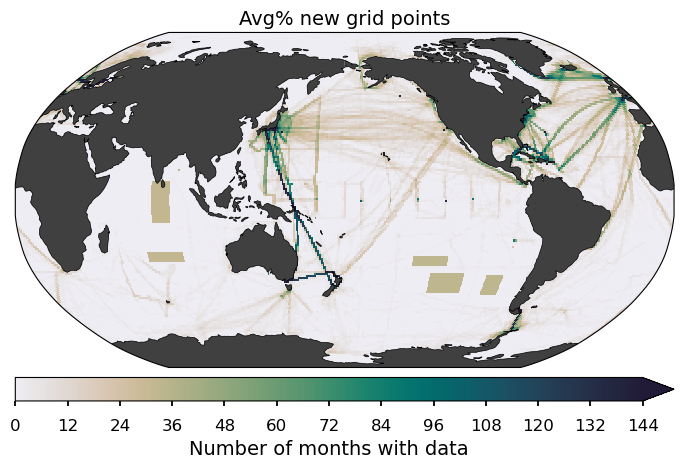

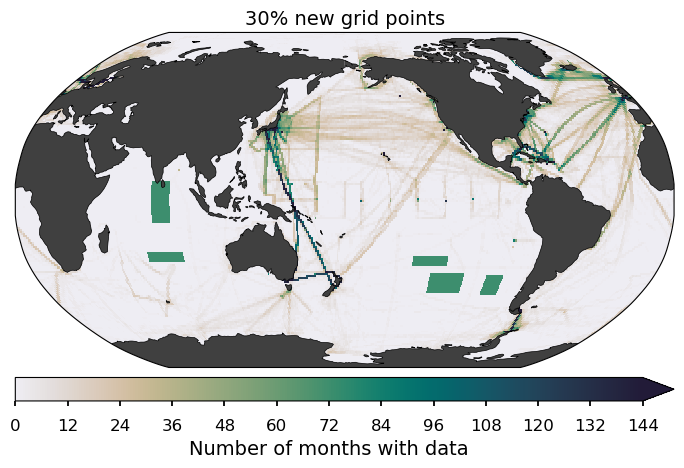

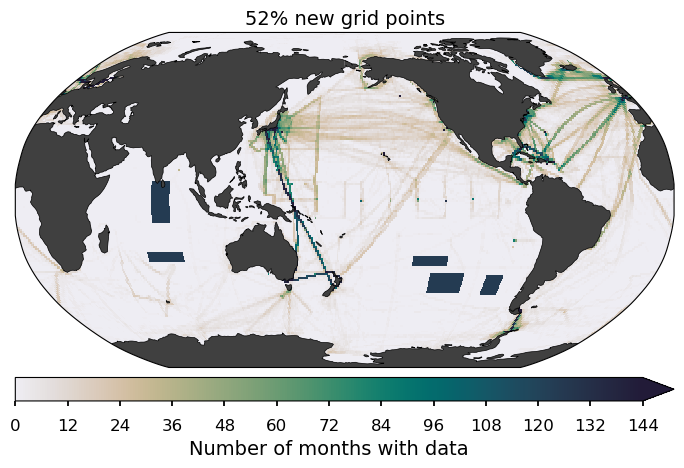

In [ ]:
plot_mask(addmeanp_oceans, "Avg% new grid points")
plot_mask(add30p_oceans, "30% new grid points")
plot_mask(add50p_oceans, "52% new grid points")

In [11]:
mask_data_dict = {
    "baseline": socat_mask_data,
    "densify_mean_pattern": socat_mean_glob,
    "densify_30p": socat_30p_glob,
    "densify_50p": socat_50p_glob,
    "expand_14p": addmeanp_socat,
    "expand_30p": add30p_socat,
    "expand_50p": add50p_socat,
}


In [12]:
non_zero_dict = {
    "baseline" : non_zero_counts,
    "densify_mean_pattern": mean_val_glob_loc,
    "densify_30p": thirtyp_val_glob,
    "densify_50p": fiftyp_val_glob,
    "expand_14p": addmeanp_oceans,
    "expand_30p": add30p_oceans,
    "expand_50p": add50p_oceans
    
}

## Model Training

In [13]:
%%capture
!pip install --upgrade ngboost

In [14]:
def apply_socat_mask_inplace(df: pd.DataFrame, mask_dataset: xr.Dataset) -> None:
    """
    Fast in-place assignment of 'socat_mask' from an xarray.Dataset to a DataFrame with MultiIndex (time, ylat, xlon).

    Parameters:
        df (pd.DataFrame): DataFrame with MultiIndex (time, ylat, xlon)
        mask_dataset (xr.Dataset): xarray dataset containing 'socat_mask' with dims (time, ylat, xlon)

    Returns:
        None (modifies df in-place)
    """
    time = df.index.get_level_values("time").values
    ylat = df.index.get_level_values("ylat").astype(float).values
    xlon = df.index.get_level_values("xlon").astype(float).values

    mask_da = mask_dataset["socat_mask"]
    mask_vals = mask_da.sel(
        time=xr.DataArray(time, dims="points"),
        ylat=xr.DataArray(ylat, dims="points"),
        xlon=xr.DataArray(xlon, dims="points"),
        method="nearest",
    ).values

    if hasattr(mask_vals, "compute"):
        mask_vals = mask_vals.compute()

    df["socat_mask"] = np.nan_to_num(mask_vals, nan=0).astype(int)


In [15]:
import pickle
from pathlib import Path
import gcsfs

def save_ngb_model_locally(model, dates, mask_name, ens, member, username):
    """
    Saves the trained XGBoost model to a local directory.

    Parameters
    ----------
    model : xgboost.sklearn.XGBRegressor
        Trained XGBoost model.

    dates : pandas.DatetimeIndex
        List of dataset dates.

    mask_name : str
        Name of the socat mask used for training.

    ens : str
        Earth System Model name.

    member : str
        Member index (e.g., 'member_r1i1p1f1').
    username : str
        Username of the person running the code. Reviewer should also change this to their own username.
    """

    print("Starting local model saving process...")

    # Ensure the output directory exists
    Path("output/model_saved").mkdir(parents=True, exist_ok=True)

    # Format time information
    init_date = f"{dates[0].year}{dates[0].month:02d}"
    fin_date = f"{dates[-1].year}{dates[-1].month:02d}"

    # Define the local filename
    model_filename = f"{mask_name}_model_pCO2_2D_{ens}_{member.split('_')[-1]}_mon_1x1_{init_date}_{fin_date}.p"
    local_output_dir = "output/model_saved"
    model_path = Path(local_output_dir) / model_filename

    gcsfs_path = f"gs://leap-persistent/{username}/models/{model_filename}"
    fs = gcsfs.GCSFileSystem()

    # Save the model
    try:
        with model_path.open("wb") as f:
            pickle.dump(model, f)
        print(f"Model successfully saved locally at: {model_path}")

        with fs.open(gcsfs_path, "wb") as gcs_file:
            pickle.dump(model, gcs_file)
        print(f"Model successfully saved to GCS at: {gcsfs_path}")
    except Exception as e:
        print(f"Error saving model: {e}")

    print("Local model saving process complete.")


In [16]:
from collections import defaultdict
import pandas as pd
import numpy as np
import datetime
import csv
from ngboost import NGBRegressor
from ngboost.distns import Normal
from ngboost.scores import LogScore
import gcsfs
import lib.residual_utils as supporting_functions

def run_ngboost_with_masks(
    mask_data_dict,
    selected_mems_dict,
    features_sel,
    target_sel,
    year_mon,
    test_year_mon,
    path_seeds,
    MLinputs_path,
    init_date,
    fin_date,
    metrics_output_dir,
    params,
    runthiscell=-1,
    your_username = your_username,
):
    fs = gcsfs.GCSFileSystem()
    if runthiscell:
        random_seeds = np.load(fs.open(path_seeds))
    seed_loc_dict = defaultdict(dict)
    for ens, mem_list in selected_mems_dict.items():
        sub_dictt = {mem: no for no, mem in enumerate(mem_list)}
        seed_loc_dict[ens] = sub_dictt

    val_prop = 0.2
    test_prop = 0.0

    print(datetime.datetime.now())

    if runthiscell == -1:
        print(
            "Reviewing process: Running ML only for the first member of the first ESM. \n"
            "Running ML only for the first mask."
        )
        first_ens = list(selected_mems_dict.keys())[0]
        first_mem = selected_mems_dict[first_ens][0]
        run_selected_mems_dict = {first_ens: [first_mem]}
        first_mask = list(mask_data_dict.keys())[0]
        run_selected_mask_data_dict = {first_mask: mask_data_dict[first_mask]}
    else:
        print(
            "Running ML for all members of all ESMs and all masks. \n"
            "This may take a while."
        )
        run_selected_mems_dict = selected_mems_dict
        run_selected_mask_data_dict = mask_data_dict


    for mask_name, mask_data in run_selected_mask_data_dict.items():
        print(f"\nRunning NGBoost for mask: {mask_name}\n")

        for ens, mem_list in run_selected_mems_dict.items():
            for member in mem_list:
                print(ens, member)
                seed_loc = seed_loc_dict[ens][member]
                data_dir = f"{MLinputs_path}/{ens}/{member}"
                fname = f"MLinput_{ens}_{member.split('_')[-1]}_mon_1x1_{init_date}_{fin_date}.pkl"
                file_path = f"{data_dir}/{fname}"

                with fs.open(file_path, "rb") as filee:
                    df = pd.read_pickle(filee)
                    df["year"] = df.index.get_level_values("time").year
                    df["mon"] = df.index.get_level_values("time").month
                    df["year_month"] = (
                        df["year"].astype(str) + "-" + df["mon"].astype(str)
                    )

                    # print df['socat+mask'] stats before applying new mask
                    print(df['socat_mask'].describe())
                    

                    # Replace socat_mask with the new mask
                    apply_socat_mask_inplace(df, mask_data)
                    print("Applied new SOCAT mask")
                    # print df['socat+mask'] stats after applying new mask
                    print(df['socat_mask'].describe())

                    recon_sel = (
                        ~df[features_sel + target_sel + ["net_mask"]].isna().any(axis=1)
                    ) & (
                        (df[target_sel] < 250) & (df[target_sel] > -250)
                    ).to_numpy().ravel()

                    sel = recon_sel & (df["socat_mask"] == 1)

                    train_sel = (
                        (sel & (pd.Series(df["year_month"]).isin(year_mon)))
                        .to_numpy()
                        .ravel()
                    )
                    test_sel = (
                        (sel & (pd.Series(df["year_month"]).isin(test_year_mon)))
                        .to_numpy()
                        .ravel()
                    )

                    X = df.loc[sel, features_sel].to_numpy()
                    y = df.loc[sel, target_sel].to_numpy().ravel()
                    Xtrain = df.loc[train_sel, features_sel].to_numpy()
                    ytrain = df.loc[train_sel, target_sel].to_numpy().ravel()
                    X_test = df.loc[test_sel, features_sel].to_numpy()
                    y_test = df.loc[test_sel, target_sel].to_numpy().ravel()

                    N = Xtrain.shape[0]
                    train_val_idx, train_idx, val_idx, test_idx = (
                        supporting_functions.train_val_test_split(
                            N, test_prop, val_prop, random_seeds, seed_loc
                        )
                    )

                    (
                        X_train_val,
                        X_train,
                        X_val,
                        X_test_tmp,
                        y_train_val,
                        y_train,
                        y_val,
                        y_test_tmp,
                    ) = supporting_functions.apply_splits(
                        Xtrain, ytrain, train_val_idx, train_idx, val_idx, test_idx
                    )

                model = NGBRegressor(
                    Dist=Normal, random_state=random_seeds[5, seed_loc], **params
                )
                model.fit(X_train_val, y_train_val, X_val=X_val, Y_val=y_val)

                # save ngboost model
                save_ngb_model_locally(
                    model, dates, mask_name, ens, member, your_username
                )
                

                y_pred_test = model.predict(X_test)
                pred_dist = model.pred_dist(X_test)

                pred_dist_dict = {
                    "mean_preds": pred_dist.loc,
                    "std_preds": pred_dist.scale,
                }

                test_performance = supporting_functions.evaluate_test(
                    y_test, y_pred_test
                )

                # Save prediction distribution
                rows = [
                    {
                        "ensemble": ens,
                        "member": member,
                        "index": i,
                        "mean_pred": pred_dist_dict["mean_preds"][i],
                        "std_pred": pred_dist_dict["std_preds"][i],
                        "mask": mask_name,
                    }
                    for i in range(len(pred_dist_dict["mean_preds"]))
                ]

                df_out = pd.DataFrame(rows)
                test_dist_fname = f"{metrics_output_dir}/ngb_test_dists_{mask_name}_{init_date}-{fin_date}.csv"
                print("Saving test distribution to", test_dist_fname)
                df_out.to_csv(test_dist_fname, index=False)

                # Save evaluation metrics
                test_row_dict = {"model": ens, "member": member, "mask": mask_name}
                test_row_dict.update(test_performance)
                
                test_perform_fname = f"{metrics_output_dir}/ngb_test_performance_{mask_name}_{init_date}-{fin_date}.csv"  # path for test performance metrics
                file_exists = fs.exists(test_perform_fname)
                with fs.open(test_perform_fname, "a") as f_object:
                    writer = csv.DictWriter(f_object, fieldnames=test_row_dict.keys())
                    if not file_exists:
                        writer.writeheader()
                    writer.writerow(test_row_dict)

                print(f"Test metrics for {mask_name}:", test_performance)

        print(f"Done with mask: {mask_name} at", datetime.datetime.now())


In [17]:
# features for ML:
features_sel = [
    "sst",
    "sst_anom",
    "sss",
    "sss_anom",
    "mld_clim_log",
    "chl_log",
    "chl_log_anom",
    "xco2",
    "A",
    "B",
    "C",
    "T0",
    "T1",
]

# the target variable we reconstruct:
target_sel = [
    "pco2_residual"
]  # this represents pCO2 - pCO2-T (calculated in notebook 00)


In [18]:
### train-validate-test split proportions ###

select_dates = []
test_dates = []

for i in range(0, len(dates)):
    if i % 5 != 0:
        select_dates.append(dates[i])  ### 80% train days set ###
    if i % 5 == 0:
        test_dates.append(dates[i])  ### 20% test days set ###

### Then, the month numbers above are converted back to their respective datetime objects.

year_mon = []

for i in range(0, len(select_dates)):
    tmp = select_dates[i]
    year_mon.append(f"{tmp.year}-{tmp.month}")

test_year_mon = []

for i in range(0, len(test_dates)):
    tmp = test_dates[i]
    test_year_mon.append(f"{tmp.year}-{tmp.month}")


In [19]:
path_seeds = (
    "gs://leap-persistent/abbysh/pickles/random_seeds.npy"  # random seeds for ML
)
grid_search_approach = "nmse"
MLinputs_path = "gs://leap-persistent/Mukkke/pco2_residual/post01_xgb_inputs"
output_dir = f"gs://leap-persistent/{your_username}/{owner_username}/pco2_residual/{grid_search_approach}/post02_xgb"  # where to save machine learning results
metrics_output_dir = f"{output_dir}/metrics"  # where to save performance metrics
test_perform_fname = f"{metrics_output_dir}/ngb_test_performance_{init_date}-{fin_date}.csv"  # path for test performance metrics

In [20]:
ngb_params = {
    "n_estimators": 500,  # Number of boosting rounds
    "learning_rate": 0.05,  # Learning rate
    "natural_gradient": True,  # Use natural gradient
    "minibatch_frac": 0.8,  # Proportion of data used per iteration
    "col_sample": 0.8,  # Feature proportion per tree
    "verbose": True,  # Disable training output
    "Score": LogScore,  # Loss function
    "early_stopping_rounds": 25,  # Early stopping rounds
}


In [21]:
selected_mems_dict = {
    "ACCESS-ESM1-5": ["member_r10i1p1f1", "member_r5i1p1f1", "member_r2i1p1f1"],
}


In [22]:
mask_data_dict = {
    # "baseline": socat_mask_data,
    # "densify_mean_pattern": socat_mean_glob,
    # "densify_30p": socat_30p_glob,
    "densify_50p": socat_50p_glob,
    # "expand_14p": addmeanp_socat,
    # "expand_30p": add30p_socat,
    # "expand_50p": add50p_socat
}

In [270]:
# Call the function
run_ngboost_with_masks(
    mask_data_dict=mask_data_dict,
    selected_mems_dict=selected_mems_dict,
    features_sel=features_sel,
    target_sel=target_sel,
    year_mon=year_mon,
    test_year_mon=test_year_mon,
    path_seeds=path_seeds,
    MLinputs_path=MLinputs_path,
    init_date=init_date,
    fin_date=fin_date,
    metrics_output_dir=metrics_output_dir,
    params=ngb_params,  # NGBoost parameters
    runthiscell=-1,  # -1 = first member of first ensemble only (use 1 to run all)
    your_username=your_username,  # username of the person running the code. Reviewer should also change this to their own username.
)


2025-04-26 23:43:33.997008
Reviewing process: Running ML only for the first member of the first ESM. 
Running ML only for the first mask.

Running NGBoost for mask: baseline

ACCESS-ESM1-5 member_r10i1p1f1
count    1.555200e+07
mean     1.846200e-02
std      1.346148e-01
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      1.000000e+00
Name: socat_mask, dtype: float64
Applied new SOCAT mask
count    1.555200e+07
mean     1.846200e-02
std      1.346148e-01
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      1.000000e+00
Name: socat_mask, dtype: float64
Using passed validation data to check for early stopping.
[iter 0] loss=4.7302 val_loss=4.6919 scale=1.0000 norm=19.5712
[iter 100] loss=3.9163 val_loss=3.9104 scale=1.0000 norm=11.0588
[iter 200] loss=3.7655 val_loss=3.7641 scale=1.0000 norm=9.5402
[iter 300] loss=3.6673 val_loss=3.6677 scale=1.0000 norm=8.6114
[iter 400] loss=3.6148 val_loss=3.6171 

In [ ]:
stop here

## Reconstruction using ESMs

In [23]:
seed_loc_dict = defaultdict(dict)
for ens, mem_list in selected_mems_dict.items():
    sub_dictt = {mem: no for no, mem in enumerate(mem_list)}
    seed_loc_dict[ens] = sub_dictt

In [24]:
fs = gcsfs.GCSFileSystem()
def run_reconstruction_with_masks(
    mask_data_dict,
    selected_mems_dict,
    features_sel,
    target_sel,
    year_mon,
    test_year_mon,
    seed_loc_dict,
    MLinputs_path,
    init_date,
    fin_date,
    dates,
    runthiscell=1,
    username=None,
):
    if runthiscell == -1:
        print(
            "Reviewing process: Running reconstruction only for the first member of the first ESM. \n"
            "Running reconstruction only for the first mask."
        )
        first_ens = list(selected_mems_dict.keys())[0]
        first_mem = selected_mems_dict[first_ens][0]
        run_selected_mems_dict = {first_ens: [first_mem]}
        first_mask = list(mask_data_dict.keys())[0]
        run_selected_mask_data_dict = {first_mask: mask_data_dict[first_mask]}
    else:
        print(
            "Running reconstruction for all members of all ESMs and all masks. \n"
            "This may take a while."
        )
        run_selected_mems_dict = selected_mems_dict
        run_selected_mask_data_dict = mask_data_dict
        
    # Save summary of mask coverage
    summary_rows = []
    for mask_name, mask_data in run_selected_mask_data_dict.items():
        print(f"\nRunning reconstruction for mask: {mask_name}\n")

        for ens, mem_list in run_selected_mems_dict.items():
            for member in mem_list:
                print(ens, member)
                seed_loc = seed_loc_dict[ens][member]
                data_dir = f"{MLinputs_path}/{ens}/{member}"
                fname = f"MLinput_{ens}_{member.split('_')[-1]}_mon_1x1_{init_date}_{fin_date}.pkl"
                file_path = f"{data_dir}/{fname}"

                # Load the model
                model_filename = f"{mask_name}_model_pCO2_2D_{ens}_{member.split('_')[-1]}_mon_1x1_{init_date}_{fin_date}.p"
                if username:
                    model_path = f"gs://leap-persistent/{username}/models/{model_filename}"
                    with fs.open(model_path, "rb") as f:
                        model = pickle.load(f)
                    print(f"Model loaded from GCS at: {model_path}")

                else:
                    local_output_dir = "output/model_saved"
                    model_path = Path(local_output_dir) / model_filename

                    with open(model_path, "rb") as f:
                        model = pickle.load(f)
                    print(f"Model loaded from local path: {model_path}")

                

                with fs.open(file_path, "rb") as filee:
                    df = pd.read_pickle(filee)
                    df["year"] = df.index.get_level_values("time").year
                    df["mon"] = df.index.get_level_values("time").month
                    df["year_month"] = (
                        df["year"].astype(str) + "-" + df["mon"].astype(str)
                    )

                    # print df['socat_mask'] stats before applying new mask
                    print(df['socat_mask'].describe())

                    # Replace socat_mask with the new mask
                    apply_socat_mask_inplace(df, mask_data)
                    print("Applied new SOCAT mask")

                    # print df['socat_mask'] stats after applying new mask
                    print(df['socat_mask'].describe())

                    recon_sel = (
                        ~df[features_sel + target_sel + ["net_mask"]].isna().any(axis=1)
                    ) & (
                        (df[target_sel] < 250) & (df[target_sel] > -250)
                    ).to_numpy().ravel()

                    sel = recon_sel & (df["socat_mask"] == 1)
                    train_sel = (
                        (sel & (pd.Series(df["year_month"]).isin(year_mon)))
                        .to_numpy()
                        .ravel()
                    )
                    test_sel = (
                        (sel & (pd.Series(df["year_month"]).isin(test_year_mon)))
                        .to_numpy()
                        .ravel()
                    )
                    unseen_sel = recon_sel & (df["socat_mask"] == 0)

                    print(f"Total selected locations for training ({mask_name}):", sel.sum())
                    print(f"Total unseen locations ({mask_name}):", unseen_sel.sum())


                    X = df.loc[sel, features_sel].to_numpy()
                    y = df.loc[sel, target_sel].to_numpy().ravel()

                y_pred_unseen = model.predict(
                    df.loc[unseen_sel, features_sel].to_numpy()
                )
                y_dists_unseen = model.pred_dist(
                    df.loc[unseen_sel, features_sel].to_numpy()
                )
                y_unseen = df.loc[unseen_sel, target_sel].to_numpy().ravel()

                unseen_performance = defaultdict(dict)
                unseen_performance[ens][member] = supporting_functions.evaluate_test(
                    y_unseen, y_pred_unseen
                )

                fields = unseen_performance[ens][member].keys()
                unseen_row_dict = {"model": ens, "member": member, "mask": mask_name}
                for field in fields:
                    unseen_row_dict[field] = unseen_performance[ens][member][field]

                unseen_perform_fname = f"{metrics_output_dir}/ngb_unseen_performance_{mask_name}_{init_date}-{fin_date}.csv"  # path for unseen performance metrics

                file_exists = fs.exists(unseen_perform_fname)
                with fs.open(unseen_perform_fname, "a") as f_object:
                    writer = csv.DictWriter(f_object, fieldnames=unseen_row_dict.keys())
                    if not file_exists:
                        writer.writeheader()
                    writer.writerow(unseen_row_dict)

                print(f"unseen performance metrics for {mask_name}:", unseen_performance[ens][member])

                y_pred_seen = model.predict(X)
                y_dists_seen = model.pred_dist(X)

                df["pCO2_recon_full"] = np.nan
                df.loc[unseen_sel, "pCO2_recon_full"] = y_pred_unseen
                df.loc[unseen_sel, "pCO2_recon_full_mean"] = y_dists_unseen.loc
                df.loc[unseen_sel, "pCO2_recon_full_std"] = y_dists_unseen.scale
                df.loc[sel, "pCO2_recon_full"] = y_pred_seen
                df.loc[sel, "pCO2_recon_full_mean"] = y_dists_seen.loc
                df.loc[sel, "pCO2_recon_full_std"] = y_dists_seen.scale

                df["pCO2_recon_unseen"] = np.nan
                df.loc[unseen_sel, "pCO2_recon_unseen"] = y_pred_unseen
                df.loc[unseen_sel, "pCO2_recon_unseen_mean"] = y_dists_unseen.loc
                df.loc[unseen_sel, "pCO2_recon_unseen_std"] = y_dists_unseen.scale
                df.loc[sel, "pCO2_recon_unseen"] = np.nan

                df["pCO2_truth"] = df.loc[:, target_sel]

                DS_recon = df[
                    [
                        "net_mask",
                        "socat_mask",
                        "pCO2_recon_full",
                        "pCO2_recon_unseen",
                        "pCO2_truth",
                        "pCO2_recon_full_mean",
                        "pCO2_recon_full_std",
                        "pCO2_recon_unseen_mean",
                        "pCO2_recon_unseen_std",
                    ]
                ].to_xarray()
                recon_output_dir = f"{output_dir}/reconstructions/{mask_name}"
                supporting_functions.save_recon(
                    DS_recon, dates, recon_output_dir, ens, member
                )

                

                summary_rows.append(
                    {
                        "mask": mask_name,
                        "member": member,
                        "seen_count": int(sel.sum()),
                        "unseen_count": int(unseen_sel.sum()),
                    }
                )
    pd.DataFrame(summary_rows).to_csv(
        f"{metrics_output_dir}/mask_coverage_summary.csv", index=False
    )

    print("end of all members", datetime.datetime.now())


In [271]:
run_reconstruction_with_masks(
    mask_data_dict=mask_data_dict,
    selected_mems_dict=selected_mems_dict,
    features_sel=features_sel,
    target_sel=target_sel,
    year_mon=year_mon,
    test_year_mon=test_year_mon,
    seed_loc_dict=seed_loc_dict,
    MLinputs_path=MLinputs_path,
    init_date=init_date,
    fin_date=fin_date,
    dates=dates,
    runthiscell=-1,  # -1 = first member of first ensemble only (use 1 to run all)
    username=your_username,  # username of the person running the code. Reviewer should also change this to their own username.
)

Reviewing process: Running reconstruction only for the first member of the first ESM. 
Running reconstruction only for the first mask.

Running reconstruction for mask: baseline

ACCESS-ESM1-5 member_r10i1p1f1
Model loaded from GCS at: gs://leap-persistent/azamkhan99/models/baseline_model_pCO2_2D_ACCESS-ESM1-5_r10i1p1f1_mon_1x1_200401_202312.p
count    1.555200e+07
mean     1.846200e-02
std      1.346148e-01
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      1.000000e+00
Name: socat_mask, dtype: float64
Applied new SOCAT mask
count    1.555200e+07
mean     1.846200e-02
std      1.346148e-01
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      1.000000e+00
Name: socat_mask, dtype: float64
Total selected locations for training (baseline): 223875
Total unseen locations (baseline): 7859225
unseen performance metrics for baseline: {'mse': 182.78102495652192, 'mae': 8.838994237415744, 'medae': np.float6

## Inverse Residual Transformation

In [25]:
def calc_recon_pco2(
    regridded_members_dir,
    pco2_recon_dir,
    selected_mems_dict,
    mask_name,
    init_date,
    fin_date,
    owner_name=None,
):
    """
    Calculates reconstructed pco2 per member.

    Parameters
    ----------
    regridded_members_dir : str
        Path to regridded data from notebook 00, which contains pco2T.

    pco2_recon_dir : str
        Path to directory where ML reconstructions from notebook 02 are saved.
    """
    init_date_sel = pd.to_datetime(init_date, format="%Y%m")
    fin_date_sel = pd.to_datetime(fin_date, format="%Y%m")

    if owner_name:
        print(
            "Reviewing process: Running ML only for the first member of the first ESM, loading remaining reconstructed data from the notebook owner."
        )
        first_ens = list(selected_mems_dict.keys())[0]  # Get the first ensemble key
        first_mem = selected_mems_dict[first_ens][
            0
        ]  # Get the first member in that ensemble
        run_selected_mems_dict = {
            first_ens: [first_mem]
        }  # Create a dictionary with only the first ensemble and member
        
        grid_search_approach = "nmse"
        owener_output_dir = f"gs://leap-persistent/{owner_name}/{owner_name}/pco2_residual/{grid_search_approach}/post02_xgb"  # where to save machine learning results
        owener_recon_output_dir = f"{owener_output_dir}/reconstructions/{mask_name}"  # where owner save ML reconstructions

    else:
        run_selected_mems_dict = selected_mems_dict

    for ens, mem_list in run_selected_mems_dict.items():
        print(f"Current ESM: {ens}")

        for member in mem_list:
            print(f"On member {member}")

            ### File paths ###

            ### Path to regridded data from notebook 00, so we can get the pCO2-T we calculated in 00
            ### pCO2-T calculated from model pCO2 and SST
            pco2T_path = f"{regridded_members_dir}/{ens}/{member}/{ens}.{member.split('_')[-1]}.Omon.zarr"
            print("pco2T path:", pco2T_path)

            
            
            ### Path to reconstruction (ML output from notebook 02), where pCO2-residual was reconstructed
            pCO2R_path = f"{pco2_recon_dir}/{ens}/{member}/recon_pCO2residual_{ens}_{member}_mon_1x1_{init_date}_{fin_date}.zarr"
            print("pCO2R path:", pCO2R_path)

            ### Path to save calculated pCO2 (reconstructed pCO2-residual PLUS pCO2-T: Total pCO2 =  pCO2-residual + pCO2-T)
            file_out = f"{pco2_recon_dir}/{ens}/{member}/recon_pCO2_{ens}_{member}_mon_1x1_{init_date}_{fin_date}.zarr"  # change this to just pco2
            print("save path:", file_out)

            ### Loading pCO2-T and reconstructed pCO2-residual:
            pco2T_series = (
                xr.open_zarr(pco2T_path)
                .pco2_T.transpose("time", "ylat", "xlon")
                .sel(time=slice(init_date_sel, fin_date_sel))
            )
            pco2_ml_output = xr.open_zarr(
                pCO2R_path
            )  # , consolidated=False, storage_options={"token": "cloud"}, group=None)

            ### unseen reconstructed pCO2-Residual from XGB
            pCO2R_unseen_series = pco2_ml_output.pCO2_recon_unseen.transpose(
                "time", "ylat", "xlon"
            )

            pCO2R_unseen_means_series = pco2_ml_output.pCO2_recon_unseen_mean.transpose(
                "time", "ylat", "xlon"
            )
            pCO2R_unseen_stds_series = pco2_ml_output.pCO2_recon_unseen_std.transpose(
                "time", "ylat", "xlon"
            )

            ### Full (seen and unseen) reconstructed pCO2-Residual from XGB
            pCO2R_full_series = pco2_ml_output.pCO2_recon_full.transpose(
                "time", "ylat", "xlon"
            )

            pCO2_full_means_series = pco2_ml_output.pCO2_recon_full_mean.transpose(
                "time", "ylat", "xlon"
            )

            pCO2_full_stds_series = pco2_ml_output.pCO2_recon_full_std.transpose(
                "time", "ylat", "xlon"
            )

            # ### training set for pco2 residual
            # pCO2R_train_series = pco2_ml_output.pCO2_recon_train.transpose("time","ylat","xlon")

            # ### testing set for pco2 residual
            # pCO2R_test_series = pco2_ml_output.pCO2_recon_test.transpose("time","ylat","xlon")

            pCO2R_truth = pco2_ml_output.pCO2_truth.transpose("time", "ylat", "xlon")

            ### Get time coordinate correct
            pco2T_series = pco2T_series.assign_coords(
                {"time": ("time", pCO2R_unseen_series.time.data)}
            )

            ### Total pCO2 =  pCO2-residual + pCO2-T
            pco2_unseen = pco2T_series + pCO2R_unseen_series
            pco2_unseen_means = pco2T_series + pCO2R_unseen_means_series
            pco2_unseen_stds = pco2T_series + pCO2R_unseen_stds_series
            pco2_full = pco2T_series + pCO2R_full_series
            pco2_full_means = pco2T_series + pCO2_full_means_series
            pco2_full_stds = pco2T_series + pCO2_full_stds_series
            # pco2_train =  pco2T_series + pCO2R_train_series
            # pco2_test =  pco2T_series + pCO2R_test_series
            pco2_truth = pco2T_series + pCO2R_truth

            ### Creating xarray of pco2 ML output, but with temperature added back
            comp = xr.Dataset(
                {
                    "pCO2_recon_unseen": (["time", "ylat", "xlon"], pco2_unseen.data),
                    "pCO2_recon_full": (["time", "ylat", "xlon"], pco2_full.data),
                    "pCO2_recon_unseen_mean": (
                        ["time", "ylat", "xlon"],
                        pco2_unseen_means.data,
                    ),
                    "pCO2_recon_unseen_std": (
                        ["time", "ylat", "xlon"],
                        pco2_unseen_stds.data,
                    ),
                    "pCO2_recon_full_mean": (
                        ["time", "ylat", "xlon"],
                        pco2_full_means.data,
                    ),
                    "pCO2_recon_full_std": (
                        ["time", "ylat", "xlon"],
                        pco2_full_stds.data,
                    ),
                    # 'pCO2_recon_train': (["time","ylat","xlon"], pco2_train.data),
                    # 'pCO2_recon_train':(["time","ylat","xlon"],pco2_train.data),
                    # 'pCO2_recon_test':(["time","ylat","xlon"],pco2_test.data),
                    "pCO2_truth": (["time", "ylat", "xlon"], pco2_truth.data),
                },
                coords={
                    "time": (["time"], pco2T_series.time.values),
                    "xlon": (["xlon"], pco2T_series.xlon.values),
                    "ylat": (["ylat"], pco2T_series.ylat.values),
                },
            )

            ### to overwrite file if it exists already
            if fs.exists(file_out):
                fs.rm(file_out, recursive=True)

            ### for saving:
            comp = comp.chunk({"time": 100, "ylat": 45, "xlon": 90})
            comp.to_zarr(file_out, mode="w", zarr_format=2)

            print(f"finished with {member}")

    if owner_name:
        print("Copying remaining members from owner’s directory...")
        for ens, mem_list in selected_mems_dict.items():
            print(f"On member {member}")
            if ens in run_selected_mems_dict:
                remaining_members = [
                    m for m in mem_list if m not in run_selected_mems_dict[ens]
                ]
            else:
                remaining_members = mem_list

            for member in remaining_members:
                owner_file_out = f"{owener_recon_output_dir}/{ens}/{member}/recon_pCO2_{ens}_{member}_mon_1x1_{init_date}_{fin_date}.zarr"
                target_file_out = f"{pco2_recon_dir}/{ens}/{member}/recon_pCO2_{ens}_{member}_mon_1x1_{init_date}_{fin_date}.zarr"

                if fs.exists(owner_file_out):
                    print(f"Copying {owner_file_out} → {target_file_out}")
                    fs.copy(owner_file_out, target_file_out)
                else:
                    print(f"Warning: {owner_file_out} not found. Skipping.")
                print(f"finished with {member}")


In [26]:
ensemble_dir = "gs://leap-persistent/abbysh/pco2_all_members_1982-2023/00_regridded_members"  # path to regridded data
# recon_output_dir = f"{output_dir}/reconstructions/{mask_name}"  # where to save reconstructions

In [272]:
runthiscell = -1  # 0 will turn off, 1 will turn on, -1 will only run first member

if runthiscell:
    # Use the first masks if only testing with the first ensemble member
    if runthiscell == -1:
        first_mask = list(mask_data_dict.keys())[0]
        run_selected_mask_data_dict = {first_mask: mask_data_dict[first_mask]}
    else:
        run_selected_mask_data_dict = mask_data_dict

    for mask_name, mask_data in run_selected_mask_data_dict.items():
        print(f"Processing mask: {mask_name}")

        calc_recon_pco2(
            regridded_members_dir=ensemble_dir,
            pco2_recon_dir=f"{output_dir}/reconstructions/{mask_name}",
            selected_mems_dict=selected_mems_dict,
            mask_name=mask_name,
            init_date=init_date,
            fin_date=fin_date,
            owner_name=your_username if runthiscell == -1 else None,
        )

        print(f"Finished processing mask: {mask_name}")


Processing mask: baseline
Reviewing process: Running ML only for the first member of the first ESM, loading remaining reconstructed data from the notebook owner.
Current ESM: ACCESS-ESM1-5
On member member_r10i1p1f1
pco2T path: gs://leap-persistent/abbysh/pco2_all_members_1982-2023/00_regridded_members/ACCESS-ESM1-5/member_r10i1p1f1/ACCESS-ESM1-5.r10i1p1f1.Omon.zarr
pCO2R path: gs://leap-persistent/azamkhan99/azamkhan99/pco2_residual/nmse/post02_xgb/reconstructions/baseline/ACCESS-ESM1-5/member_r10i1p1f1/recon_pCO2residual_ACCESS-ESM1-5_member_r10i1p1f1_mon_1x1_200401_202312.zarr
save path: gs://leap-persistent/azamkhan99/azamkhan99/pco2_residual/nmse/post02_xgb/reconstructions/baseline/ACCESS-ESM1-5/member_r10i1p1f1/recon_pCO2_ACCESS-ESM1-5_member_r10i1p1f1_mon_1x1_200401_202312.zarr
finished with member_r10i1p1f1
Copying remaining members from owner’s directory...
On member member_r10i1p1f1
finished with member_r5i1p1f1
finished with member_r2i1p1f1
Finished processing mask: baseline

In [273]:
from google.cloud import storage

if runthiscell != -1:
    client = storage.Client()
    bucket = client.bucket("leap-persistent")

    for mask_name, mask_data in mask_data_dict.items():
        print(f"Processing mask: {mask_name}")

        # Define the prefix for the blobs you want to make public
        prefix = f"{your_username}/{your_username}/pco2_residual/nmse/post02_xgb/reconstructions/{mask_name}/"
        blobs = bucket.list_blobs(prefix=prefix)

        seen_dirs = (
            set()
        )
        # Track top-level directories (immediate subdirectories of `reconstructions`)
        for blob in blobs:
            # Extract the relative path after `reconstructions/`
            relative_path = blob.name[len(prefix) :]
            top_level_dir = relative_path.split("/")[0]
            # print(relative_path)


            # Get first component
            try:
                # Make the file public
                blob.make_public()

                # Only print if it's a new top-level directory
                if top_level_dir not in seen_dirs:
                    seen_dirs.add(top_level_dir)
                    print(f"Made public: {top_level_dir}")
                    # print(seen_dirs)
            except Exception as e:
                print(f"Failed to make public: {blob.name}")
                print(e)


## Visualization of Reconstructions

In [36]:
def plot_reconstruction_vs_truth(
    mask_name,
    mask_data_dict,
    selected_mems_dict,
    ensemble_dir,
    output_dir,
    dates,
    init_date,
    fin_date,
    plot_style="seaborn-v0_8-talk",
    cmap=None,
    vrange=[280, 440],
    chosen_time="2021",
):
    import matplotlib.pyplot as plt
    import cmocean.cm as cm
    import numpy as np
    import xarray as xr

    if cmap is None:
        cmap = cm.thermal

    # Select the first ensemble and member
    first_ens = list(selected_mems_dict.keys())[0]
    first_mem = selected_mems_dict[first_ens][0]

    # Load original member data from ESM output
    member_dir = f"{ensemble_dir}/{first_ens}/{first_mem}"
    member_path = fs.glob(f"{member_dir}/*.zarr")[0]
    member_data = xr.open_zarr("gs://" + member_path).sel(
        time=slice(str(dates[0]), str(dates[-1]))
    )
    print("Member path:", member_path)

    # Load reconstructed pCO₂ data
    recon_output_dir = f"{output_dir}/reconstructions/{mask_name}"
    recon_dir = f"{recon_output_dir}/{first_ens}/{first_mem}"
    recon_path = f"{recon_dir}/recon_pCO2_{first_ens}_{first_mem}_mon_1x1_{init_date}_{fin_date}.zarr"
    print("Recon path:", recon_path)
    full = xr.open_zarr(recon_path, consolidated=True)["pCO2_recon_full"]

    # Extract specific month
    raw_data = member_data["spco2"].sel(time=chosen_time).squeeze()
    recon_data = full.sel(time=chosen_time)[0, ...]

    # Shift longitudes for global plotting
    raw_data = raw_data.roll(xlon=len(raw_data.xlon) // 2, roll_coords=True)
    recon_data = recon_data.roll(xlon=len(recon_data.xlon) // 2, roll_coords=True)

    # Load SOCAT mask and align
    mask_data = mask_data_dict[mask_name]
    mask = mask_data.sel(time=chosen_time)["socat_mask"].squeeze()
    mask = mask.roll(xlon=len(mask.xlon) // 2, roll_coords=True)

    # Mask the raw data
    masked_raw = np.ma.masked_array(raw_data, mask=(mask == 0))
    # masked_raw = raw_data

    # Start plotting
    with plt.style.context(plot_style):
        fig = plt.figure(figsize=(8, 3), dpi=200)
        worldmap = SpatialMap2(
            fig=fig,
            region="world",
            cbar_mode="single",
            colorbar=True,
            cbar_location="bottom",
            nrows_ncols=[1, 2],
        )

        sub0 = worldmap.add_plot(
            lon=raw_data["xlon"],
            lat=raw_data["ylat"],
            data=masked_raw,
            vrange=vrange,
            cmap=cmap,
            ax=0,
        )

        sub1 = worldmap.add_plot(
            lon=recon_data["xlon"],
            lat=recon_data["ylat"],
            data=recon_data,
            vrange=vrange,
            cmap=cmap,
            ax=1,
        )

        worldmap.set_title(f"{mask_name} pCO₂ ({chosen_time})", ax=0, fontsize=13)
        worldmap.set_title(f"pCO₂ Reconstruction  ({chosen_time})", ax=1, fontsize=13)

        colorbar = worldmap.add_colorbar(sub0, ax=0)
        worldmap.set_cbar_xlabel(colorbar, "pCO₂ (µatm)", fontsize=12)

        plt.show()


In [33]:
mask_data_dict = {
    "baseline": socat_mask_data,
    "densify_mean_pattern": socat_mean_glob,
    "densify_30p": socat_30p_glob,
    "densify_50p": socat_50p_glob,
    "expand_14p": addmeanp_socat,
    "expand_30p": add30p_socat,
    "expand_50p": add50p_socat
}

### Baseline Model Reconstruction

In [37]:
plot_reconstruction_vs_truth(
    mask_name="baseline",
    mask_data_dict=mask_data_dict,  # or any other mask from your mask_data_dict
    selected_mems_dict=selected_mems_dict,
    ensemble_dir=ensemble_dir,
    output_dir=output_dir,
    dates=dates,
    init_date=init_date,
    fin_date=fin_date,
    chosen_time="2021",
)


Member path: leap-persistent/abbysh/pco2_all_members_1982-2023/00_regridded_members/ACCESS-ESM1-5/member_r10i1p1f1/ACCESS-ESM1-5.r10i1p1f1.Omon.zarr
Recon path: gs://leap-persistent/azamkhan99/azamkhan99/pco2_residual/nmse/post02_xgb/reconstructions/baseline/ACCESS-ESM1-5/member_r10i1p1f1/recon_pCO2_ACCESS-ESM1-5_member_r10i1p1f1_mon_1x1_200401_202312.zarr


TypeError: Dimensions of C (12, 180, 360) should be one smaller than X(360) and Y(180) while using shading='flat' see help(pcolormesh)

### Sampling strategy: adding more samples in already-sampled locations but not changing the spatial coverage

Member path: leap-persistent/abbysh/pco2_all_members_1982-2023/00_regridded_members/ACCESS-ESM1-5/member_r10i1p1f1/ACCESS-ESM1-5.r10i1p1f1.Omon.zarr
Recon path: gs://leap-persistent/azamkhan99/azamkhan99/pco2_residual/nmse/post02_xgb/reconstructions/densify_mean_pattern/ACCESS-ESM1-5/member_r10i1p1f1/recon_pCO2_ACCESS-ESM1-5_member_r10i1p1f1_mon_1x1_200401_202312.zarr


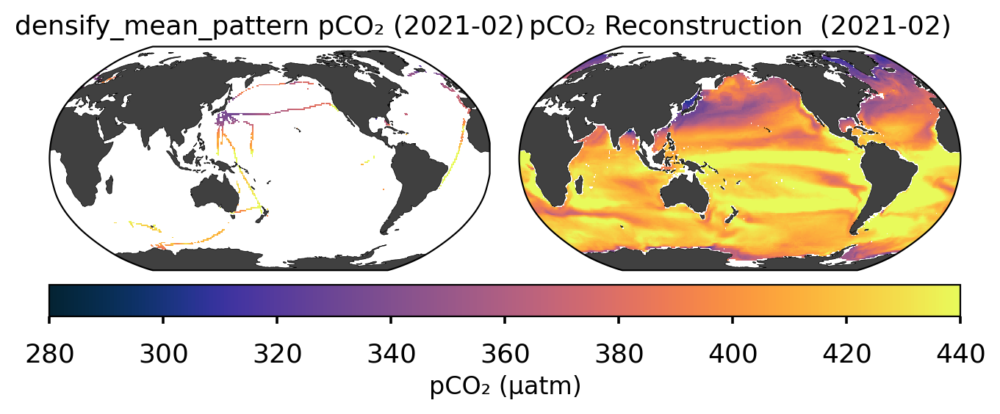

In [201]:
plot_reconstruction_vs_truth(
    mask_name="densify_mean_pattern",
    mask_data_dict=mask_data_dict,  # or any other mask from your mask_data_dict
    selected_mems_dict=selected_mems_dict,
    ensemble_dir=ensemble_dir,
    output_dir=output_dir,
    dates=dates,
    init_date=init_date,
    fin_date=fin_date,
    chosen_time="2021-02"
)


Member path: leap-persistent/abbysh/pco2_all_members_1982-2023/00_regridded_members/ACCESS-ESM1-5/member_r10i1p1f1/ACCESS-ESM1-5.r10i1p1f1.Omon.zarr
Recon path: gs://leap-persistent/azamkhan99/azamkhan99/pco2_residual/nmse/post02_xgb/reconstructions/densify_30p/ACCESS-ESM1-5/member_r10i1p1f1/recon_pCO2_ACCESS-ESM1-5_member_r10i1p1f1_mon_1x1_200401_202312.zarr


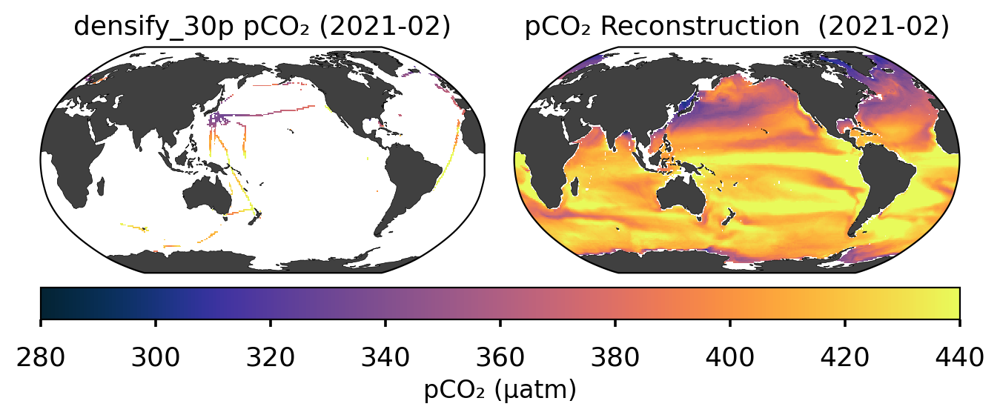

In [202]:
plot_reconstruction_vs_truth(
    mask_name="densify_30p",
    mask_data_dict=mask_data_dict,  # or any other mask from your mask_data_dict
    selected_mems_dict=selected_mems_dict,
    ensemble_dir=ensemble_dir,
    output_dir=output_dir,
    dates=dates,
    init_date=init_date,
    fin_date=fin_date,
    chosen_time="2021-02",
)


Member path: leap-persistent/abbysh/pco2_all_members_1982-2023/00_regridded_members/ACCESS-ESM1-5/member_r10i1p1f1/ACCESS-ESM1-5.r10i1p1f1.Omon.zarr
Recon path: gs://leap-persistent/azamkhan99/azamkhan99/pco2_residual/nmse/post02_xgb/reconstructions/densify_50p/ACCESS-ESM1-5/member_r10i1p1f1/recon_pCO2_ACCESS-ESM1-5_member_r10i1p1f1_mon_1x1_200401_202312.zarr


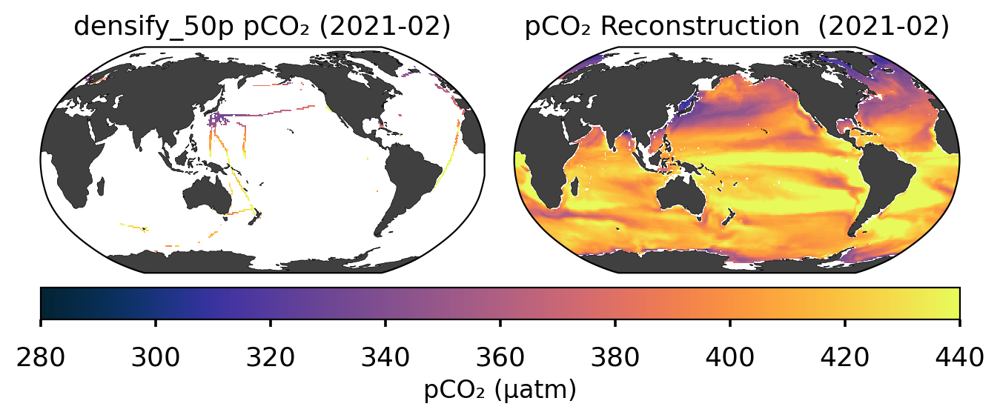

In [35]:
plot_reconstruction_vs_truth(
    mask_name="densify_50p",
    mask_data_dict=mask_data_dict,  # or any other mask from your mask_data_dict
    selected_mems_dict=selected_mems_dict,
    ensemble_dir=ensemble_dir,
    output_dir=output_dir,
    dates=dates,
    init_date=init_date,
    fin_date=fin_date,
    chosen_time="2021-02",
)


### Sampling strategy: adding more locations in under-sampled regions

Member path: leap-persistent/abbysh/pco2_all_members_1982-2023/00_regridded_members/ACCESS-ESM1-5/member_r10i1p1f1/ACCESS-ESM1-5.r10i1p1f1.Omon.zarr
Recon path: gs://leap-persistent/azamkhan99/azamkhan99/pco2_residual/nmse/post02_xgb/reconstructions/expand_14p/ACCESS-ESM1-5/member_r10i1p1f1/recon_pCO2_ACCESS-ESM1-5_member_r10i1p1f1_mon_1x1_200401_202312.zarr


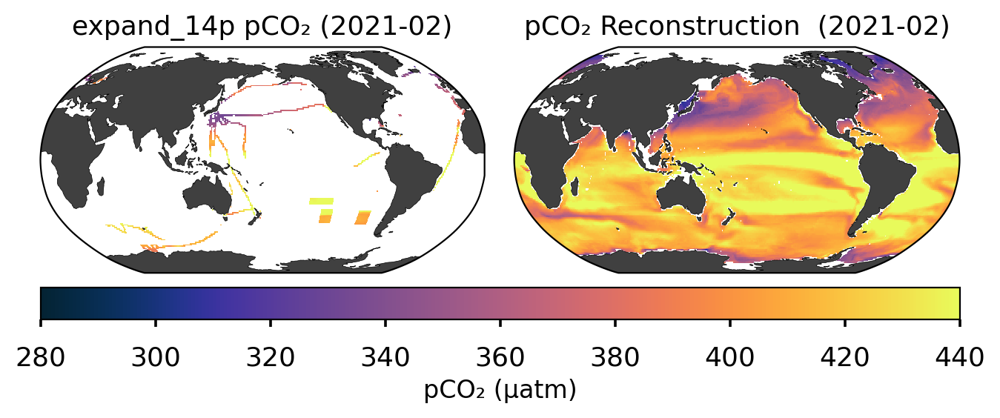

In [265]:
plot_reconstruction_vs_truth(
    mask_name="expand_14p",
    mask_data_dict=mask_data_dict,  # or any other mask from your mask_data_dict
    selected_mems_dict=selected_mems_dict,
    ensemble_dir=ensemble_dir,
    output_dir=output_dir,
    dates=dates,
    init_date=init_date,
    fin_date=fin_date,
    chosen_time="2021-02"
)


Member path: leap-persistent/abbysh/pco2_all_members_1982-2023/00_regridded_members/ACCESS-ESM1-5/member_r10i1p1f1/ACCESS-ESM1-5.r10i1p1f1.Omon.zarr
Recon path: gs://leap-persistent/azamkhan99/azamkhan99/pco2_residual/nmse/post02_xgb/reconstructions/expand_30p/ACCESS-ESM1-5/member_r10i1p1f1/recon_pCO2_ACCESS-ESM1-5_member_r10i1p1f1_mon_1x1_200401_202312.zarr


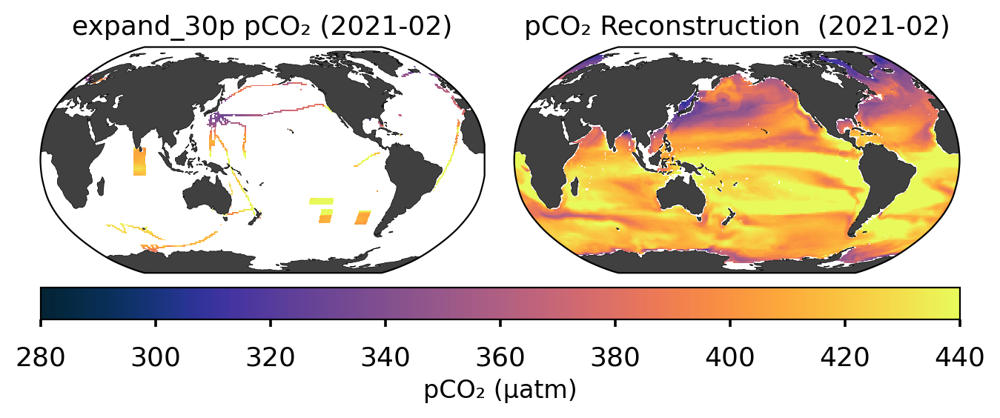

In [266]:
plot_reconstruction_vs_truth(
    mask_name="expand_30p",
    mask_data_dict=mask_data_dict,  # or any other mask from your mask_data_dict
    selected_mems_dict=selected_mems_dict,
    ensemble_dir=ensemble_dir,
    output_dir=output_dir,
    dates=dates,
    init_date=init_date,
    fin_date=fin_date,
    chosen_time="2021-02"
)


Member path: leap-persistent/abbysh/pco2_all_members_1982-2023/00_regridded_members/ACCESS-ESM1-5/member_r10i1p1f1/ACCESS-ESM1-5.r10i1p1f1.Omon.zarr
Recon path: gs://leap-persistent/azamkhan99/azamkhan99/pco2_residual/nmse/post02_xgb/reconstructions/expand_50p/ACCESS-ESM1-5/member_r10i1p1f1/recon_pCO2_ACCESS-ESM1-5_member_r10i1p1f1_mon_1x1_200401_202312.zarr


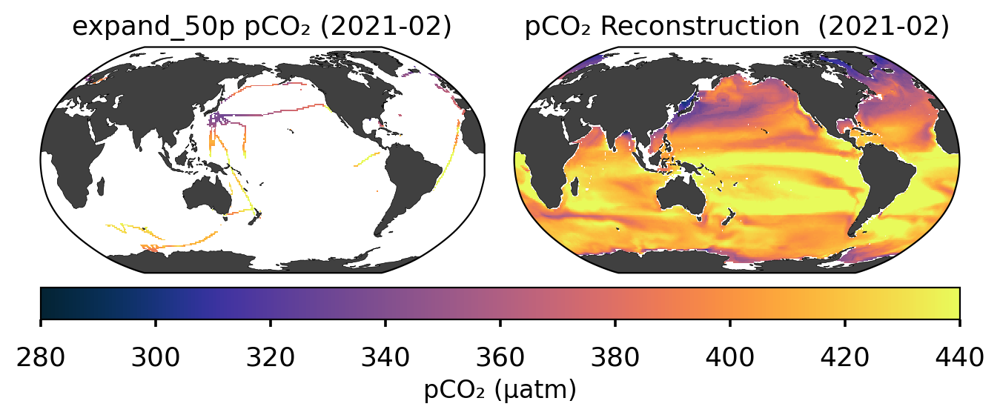

In [267]:
plot_reconstruction_vs_truth(
    mask_name="expand_50p",
    mask_data_dict=mask_data_dict,  # or any other mask from your mask_data_dict
    selected_mems_dict=selected_mems_dict,
    ensemble_dir=ensemble_dir,
    output_dir=output_dir,
    dates=dates,
    init_date=init_date,
    fin_date=fin_date,
    chosen_time="2021-02"
)

# Diff plots

In [53]:
# !!!!!! RUN IF YOU DONT WANT TO RUN THE CELLS ABOVE TO GENERATE DIFF PLOTS !!!!!!!
run_this_cell = 0 # 0 will turn off, 1 will turn on
if run_this_cell == 1:

    mask_data_dict = {
        "baseline": socat_mask_data,
        "densify_mean_pattern": socat_mean_glob,
        "densify_30p": socat_30p_glob,
        "densify_50p": socat_50p_glob,
        "expand_14p": addmeanp_socat,
        "expand_30p": add30p_socat,
        "expand_50p": add50p_socat,
    }

    selected_mems_dict = {
        "ACCESS-ESM1-5": ["member_r10i1p1f1", "member_r5i1p1f1", "member_r2i1p1f1"],
    }
    ensemble_dir = "gs://leap-persistent/abbysh/pco2_all_members_1982-2023/00_regridded_members"  # path to regridded data
    output_dir = f"gs://leap-persistent/azamkhan99/azamkhan99/pco2_residual/nmse/post02_xgb"  # where to save machine learning results

    ### Setting the date range to unify the date type ###

    # Define date range
    date_range_start = "2004-01-01T00:00:00.000000000"
    date_range_end = "2023-12-31T00:00:00.000000000"

    # create date vector, adds 14 days to start & end
    dates = pd.date_range(start=date_range_start, end=date_range_end, freq="MS")


    init_date = str(dates[0].year) + format(dates[0].month, "02d")
    fin_date = str(dates[-1].year) + format(dates[-1].month, "02d")

### Reconstruction difference

In [30]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm


def plot_masking_strategy_difference(
    mask_name_1,
    mask_name_2,
    mask_data_dict,
    selected_mems_dict,
    ensemble_dir,
    output_dir,
    dates,
    init_date,
    fin_date,
    plot_style="seaborn-v0_8-talk",
    cmap_diff="RdBu_r",  # Colormap as a string
    diff_vrange=[-30, 30],
    chosen_time="2021-01",
):
    """
    Plot the difference between reconstructions from two different masking strategies.
    """
    import numpy as np
    import xarray as xr

    # Select the first ensemble and member
    first_ens = list(selected_mems_dict.keys())[0]
    first_mem = selected_mems_dict[first_ens][0]

    # Load reconstructed pCO₂ for both masks
    recon_path_1 = f"{output_dir}/reconstructions/{mask_name_1}/{first_ens}/{first_mem}/recon_pCO2_{first_ens}_{first_mem}_mon_1x1_{init_date}_{fin_date}.zarr"
    recon_path_2 = f"{output_dir}/reconstructions/{mask_name_2}/{first_ens}/{first_mem}/recon_pCO2_{first_ens}_{first_mem}_mon_1x1_{init_date}_{fin_date}.zarr"

    recon_1 = xr.open_zarr(recon_path_1, consolidated=True)["pCO2_recon_full"].sel(
        time=chosen_time
    )[0, ...]
    recon_2 = xr.open_zarr(recon_path_2, consolidated=True)["pCO2_recon_full"].sel(
        time=chosen_time
    )[0, ...]

    # Align longitudes
    recon_1 = recon_1.roll(xlon=len(recon_1.xlon) // 2, roll_coords=True)
    recon_2 = recon_2.roll(xlon=len(recon_2.xlon) // 2, roll_coords=True)

    # Calculate the difference
    diff = recon_2 - recon_1

    # Convert colormap string to colormap object
    cmap_diff = cm.get_cmap(cmap_diff)

    # Start plotting
    with plt.style.context(plot_style):
        fig = plt.figure(figsize=(6, 3), dpi=200)
        worldmap = SpatialMap2(
            fig=fig,
            region="world",
            cbar_mode="single",
            colorbar=True,
            cbar_location="bottom",
            nrows_ncols=[1, 1],
        )

        sub0 = worldmap.add_plot(
            lon=recon_1["xlon"],
            lat=recon_1["ylat"],
            data=diff,
            vrange=diff_vrange,
            cmap=cmap_diff,  # Pass the colormap object
            ax=0,
        )

        worldmap.set_title(
            f"Reconstruction Difference\n({mask_name_2} - {mask_name_1}) ({chosen_time})",
            ax=0,
            fontsize=13,
        )
        colorbar = worldmap.add_colorbar(sub0, ax=0)
        worldmap.set_cbar_xlabel(colorbar, "Δ pCO₂ (µatm)", fontsize=12)

        plt.show()


/tmp/ipykernel_64/2915528953.py:49: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_diff = cm.get_cmap(cmap_diff)


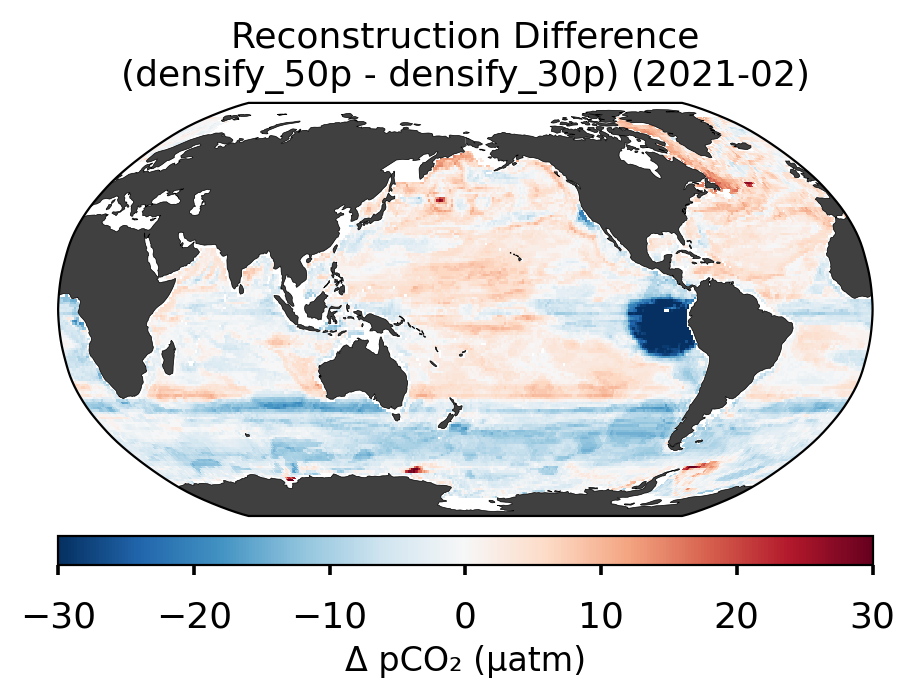

In [334]:
plot_masking_strategy_difference(
    mask_name_1="densify_30p",
    mask_name_2="densify_50p",
    mask_data_dict=mask_data_dict,
    selected_mems_dict=selected_mems_dict,
    ensemble_dir=ensemble_dir,
    output_dir=output_dir,
    dates=dates,
    init_date=init_date,
    fin_date=fin_date,
    chosen_time="2021-02",
)


/tmp/ipykernel_64/2915528953.py:49: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_diff = cm.get_cmap(cmap_diff)


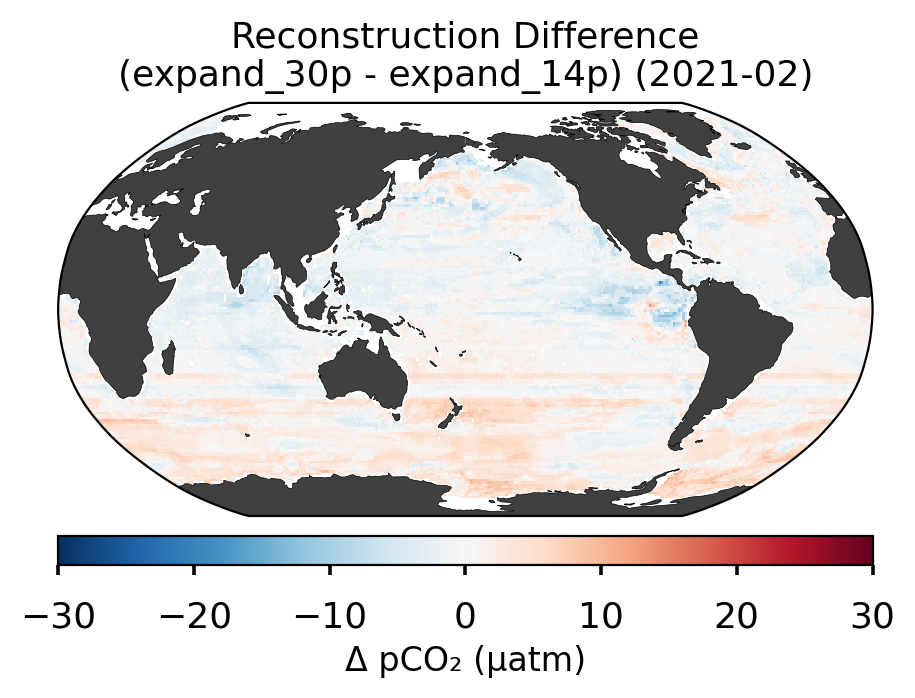

In [335]:
plot_masking_strategy_difference(
    mask_name_1="expand_14p",
    mask_name_2="expand_30p",
    mask_data_dict=mask_data_dict,
    selected_mems_dict=selected_mems_dict,
    ensemble_dir=ensemble_dir,
    output_dir=output_dir,
    dates=dates,
    init_date=init_date,
    fin_date=fin_date,
    chosen_time="2021-02",
)


### mask differences (summed over time) (NOT JUST ONE SINGLE MONTH)

In [301]:
def plot_masking_strategy_total_difference(
    mask_name_1,
    mask_name_2,
    mask_data_dict,
    plot_style="seaborn-v0_8-talk",
    cmap_mask_diff="coolwarm",
    mask_diff_vrange=[-20, 20],
):
    """
    Plot the total difference in number of months sampled between two SOCAT sampling strategies, summed over time.
    """
    import matplotlib.pyplot as plt
    import numpy as np
    import xarray as xr

    # Sum masks over time dimension
    mask1 = mask_data_dict[mask_name_1]["socat_mask"].sum(dim="time")
    mask2 = mask_data_dict[mask_name_2]["socat_mask"].sum(dim="time")

    # Align longitudes
    mask1 = mask1.roll(xlon=len(mask1.xlon) // 2, roll_coords=True)
    mask2 = mask2.roll(xlon=len(mask2.xlon) // 2, roll_coords=True)

    # Calculate difference
    mask_diff = mask2 - mask1
    cmap_mask_diff = cm.get_cmap(cmap_mask_diff)

    # Start plotting
    with plt.style.context(plot_style):
        fig = plt.figure(figsize=(6, 3), dpi=200)
        worldmap = SpatialMap2(
            fig=fig,
            region="world",
            cbar_mode="single",
            colorbar=True,
            cbar_location="bottom",
            nrows_ncols=[1, 1],
        )

        sub0 = worldmap.add_plot(
            lon=mask1["xlon"],
            lat=mask1["ylat"],
            data=mask_diff,
            vrange=mask_diff_vrange,
            cmap=cmap_mask_diff,
            ax=0,
        )

        worldmap.set_title(
            f"Total Sampling Difference\n({mask_name_2} - {mask_name_1})",
            ax=0,
            fontsize=13,
        )
        colorbar = worldmap.add_colorbar(sub0, ax=0)
        worldmap.set_cbar_xlabel(colorbar, "Δ Total Months Sampled", fontsize=12)

        plt.show()


/tmp/ipykernel_64/1323802981.py:26: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_mask_diff = cm.get_cmap(cmap_mask_diff)


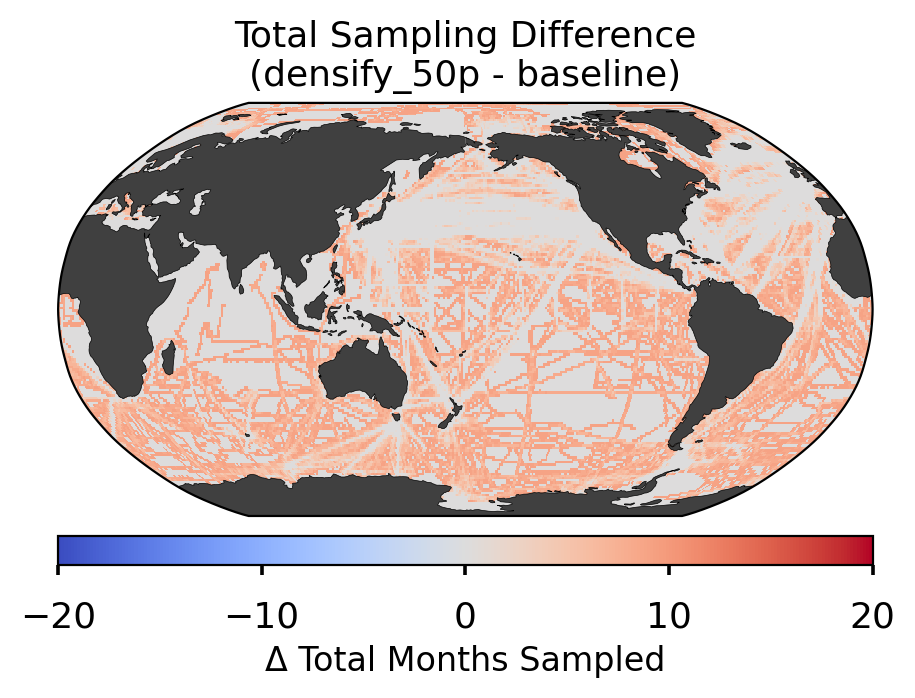

In [306]:
plot_masking_strategy_total_difference(
    mask_name_1="baseline", mask_name_2="densify_50p", mask_data_dict=mask_data_dict
)


### Putting it all together

In [35]:
import matplotlib.pyplot as plt
import numpy as np
import xarray as xr

def plot_monthly_comparison_panel(
    mask_name_1,
    mask_name_2,
    mask_data_dict,
    selected_mems_dict,
    ensemble_dir,
    output_dir,
    dates,
    init_date,
    fin_date,
    chosen_time="2021-01",
    mask_vrange=[0, 1],
    diff_vrange=[-30, 30],
    cmap_mask="Blues",
    cmap_diff="RdBu_r",
    plot_style="seaborn-v0_8-talk",
):
    
    cmap_mask = cm.get_cmap(cmap_mask)
    cmap_diff = cm.get_cmap(cmap_diff)

    # Select first ensemble member
    first_ens = list(selected_mems_dict.keys())[0]
    first_mem = selected_mems_dict[first_ens][0]

    # Load masks
    mask1 = mask_data_dict[mask_name_1].sel(time=chosen_time)["socat_mask"].squeeze()
    mask2 = mask_data_dict[mask_name_2].sel(time=chosen_time)["socat_mask"].squeeze()

    # Load reconstructions
    recon_path_1 = f"{output_dir}/reconstructions/{mask_name_1}/{first_ens}/{first_mem}/recon_pCO2_{first_ens}_{first_mem}_mon_1x1_{init_date}_{fin_date}.zarr"
    recon_path_2 = f"{output_dir}/reconstructions/{mask_name_2}/{first_ens}/{first_mem}/recon_pCO2_{first_ens}_{first_mem}_mon_1x1_{init_date}_{fin_date}.zarr"

    recon1 = xr.open_zarr(recon_path_1, consolidated=True)["pCO2_recon_full"].sel(
        time=chosen_time
    )[0, ...]
    recon2 = xr.open_zarr(recon_path_2, consolidated=True)["pCO2_recon_full"].sel(
        time=chosen_time
    )[0, ...]

    # Align longitude (roll at 180°)
    mask1 = mask1.roll(xlon=len(mask1.xlon) // 2, roll_coords=True)
    mask2 = mask2.roll(xlon=len(mask2.xlon) // 2, roll_coords=True)
    recon1 = recon1.roll(xlon=len(recon1.xlon) // 2, roll_coords=True)
    recon2 = recon2.roll(xlon=len(recon2.xlon) // 2, roll_coords=True)

    # Difference in reconstructions
    diff = recon2 - recon1

    # Start plotting
    with plt.style.context(plot_style):
        fig = plt.figure(figsize=(15, 4), dpi=200)
        worldmap = SpatialMap2(
            fig=fig,
            region="world",
            cbar_mode="each",
            colorbar=True,
            cbar_location="bottom",
            nrows_ncols=[1, 3],
        )

        # Left: sampling mask 1
        sub0 = worldmap.add_plot(
            lon=mask1["xlon"],
            lat=mask1["ylat"],
            data=mask1,
            vrange=mask_vrange,
            cmap=cmap_mask,
            ax=0,
        )
        worldmap.set_title(f"Mask: {mask_name_1}", ax=0, fontsize=13)

        # Center: sampling mask 2
        sub1 = worldmap.add_plot(
            lon=mask2["xlon"],
            lat=mask2["ylat"],
            data=mask2,
            vrange=mask_vrange,
            cmap=cmap_mask,
            ax=1,
        )
        worldmap.set_title(f"Mask: {mask_name_2}", ax=1, fontsize=13)

        # Right: difference in reconstruction
        sub2 = worldmap.add_plot(
            lon=diff["xlon"],
            lat=diff["ylat"],
            data=diff,
            vrange=diff_vrange,
            cmap=cmap_diff,
            ax=2,
        )
        worldmap.set_title(
            f"Reconstruction Difference\n({mask_name_2} - {mask_name_1})",
            ax=2,
            fontsize=13,
        )

        # Colorbars
        cbar0 = worldmap.add_colorbar(sub0, ax=0)
        cbar1 = worldmap.add_colorbar(sub1, ax=1)
        cbar2 = worldmap.add_colorbar(sub2, ax=2)

        worldmap.set_cbar_xlabel(cbar0, "Sampling Presence", fontsize=11)
        worldmap.set_cbar_xlabel(cbar1, "Sampling Presence", fontsize=11)
        worldmap.set_cbar_xlabel(cbar2, "Δ pCO₂ (µatm)", fontsize=11)


        plt.tight_layout()
        plt.show()


/tmp/ipykernel_494/991563459.py:23: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_mask = cm.get_cmap(cmap_mask)
/tmp/ipykernel_494/991563459.py:24: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_diff = cm.get_cmap(cmap_diff)


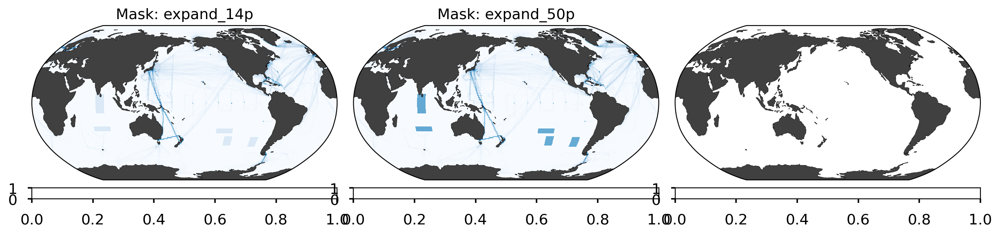

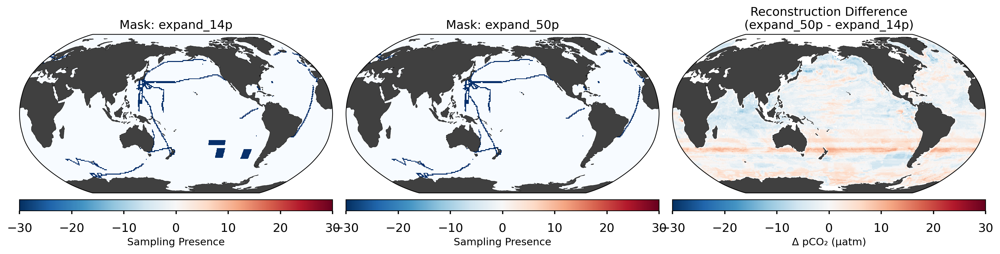

In [36]:
plot_monthly_comparison_panel(
    mask_name_1="expand_14p",
    mask_name_2="expand_50p",
    mask_data_dict=mask_data_dict,
    selected_mems_dict=selected_mems_dict,
    ensemble_dir=ensemble_dir,
    output_dir=output_dir,
    dates=dates,
    init_date=init_date,
    fin_date=fin_date,
    chosen_time="2021-02",
)


### Locations where sampling coverage changed

In [321]:
def plot_masking_strategy_month_difference(
    mask_name_1,
    mask_name_2,
    mask_data_dict,
    chosen_time="2021-02",
    plot_style="seaborn-v0_8-talk",
    cmap_mask_diff="coolwarm",
    mask_diff_vrange=[-2, 2],
):
    """
    Plot the SOCAT mask difference between two strategies for a single month.
    """
    cmap_mask_diff = cm.get_cmap(cmap_mask_diff)

    # Load single-month SOCAT mask for both strategies
    mask1 = mask_data_dict[mask_name_1].sel(time=chosen_time)["socat_mask"].squeeze()
    mask2 = mask_data_dict[mask_name_2].sel(time=chosen_time)["socat_mask"].squeeze()

    # Align longitudes for visualization
    mask1 = mask1.roll(xlon=len(mask1.xlon) // 2, roll_coords=True)
    mask2 = mask2.roll(xlon=len(mask2.xlon) // 2, roll_coords=True)

    # Calculate difference (Mask2 - Mask1)
    mask_diff = mask2 - mask1

    # Start plotting
    with plt.style.context(plot_style):
        fig = plt.figure(figsize=(6, 3), dpi=200)
        worldmap = SpatialMap2(
            fig=fig,
            region="world",
            cbar_mode="single",
            colorbar=True,
            cbar_location="bottom",
            nrows_ncols=[1, 1],
        )

        sub0 = worldmap.add_plot(
            lon=mask1["xlon"],
            lat=mask1["ylat"],
            data=mask_diff,
            vrange=mask_diff_vrange,
            cmap=cmap_mask_diff,
            ax=0,
        )

        worldmap.set_title(
            f"SOCAT Sampling Difference\n({mask_name_2} - {mask_name_1}) ({chosen_time})",
            ax=0,
            fontsize=13,
        )
        colorbar = worldmap.add_colorbar(sub0, ax=0)
        worldmap.set_cbar_xlabel(colorbar, "Δ Observations", fontsize=12)

        plt.show()


/tmp/ipykernel_64/2449472113.py:13: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_mask_diff = cm.get_cmap(cmap_mask_diff)


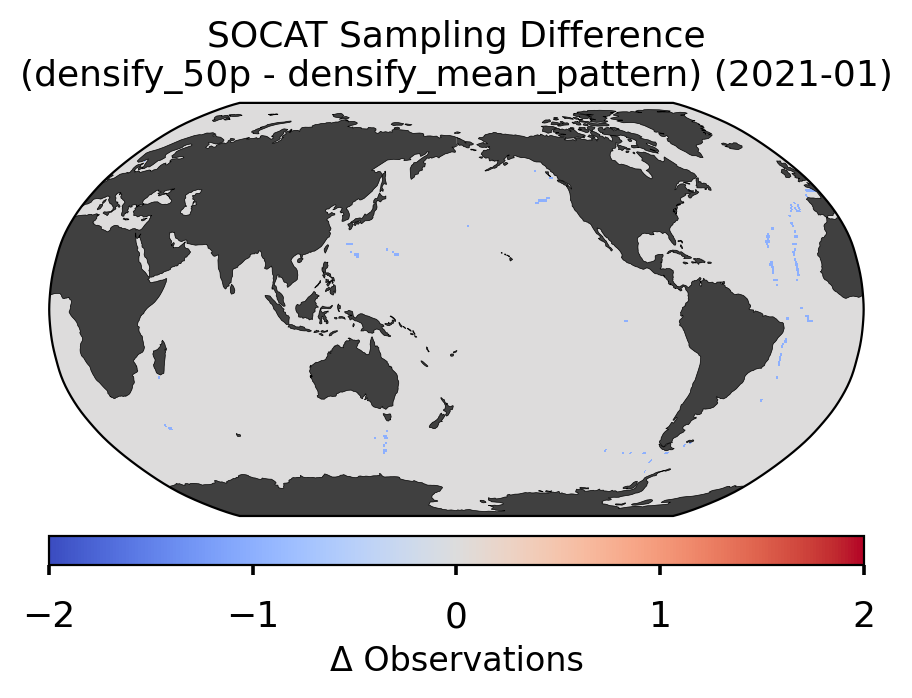

In [332]:
plot_masking_strategy_month_difference(
    mask_name_1="densify_mean_pattern",
    mask_name_2="densify_50p",
    mask_data_dict=mask_data_dict,
    chosen_time="2021-01",
)

# Uncertainty Analysis

In [245]:
import xarray as xr
import matplotlib.pyplot as plt

def plot_confidence_interval_width(
    mask_name, selected_mems_dict, output_dir, init_date, fin_date, month="2021-01"
):
    """
    Plots the 95% confidence interval width for surface pCO₂ for a given mask.

    Parameters:
        mask_name (str): Name of the mask to use.
        output_dir (str): Directory containing reconstruction outputs.
        month (str): Month to visualize in the format 'YYYY-MM'. Default is "2021-01".
    """
    # Select the first ensemble and member
    first_ens = list(selected_mems_dict.keys())[0]
    first_mem = selected_mems_dict[first_ens][0]

    
    # Path to the reconstruction data
    recon_output_dir = f"{output_dir}/reconstructions/{mask_name}"
    recon_dir = f"{recon_output_dir}/{first_ens}/{first_mem}"
    recon_path = f"{recon_dir}/recon_pCO2_{first_ens}_{first_mem}_mon_1x1_{init_date}_{fin_date}.zarr"


    # Load mean and standard deviation of reconstructed pCO₂
    pco2_mean = xr.open_zarr(recon_path, consolidated=True)["pCO2_recon_full_mean"]
    pco2_std = xr.open_zarr(recon_path, consolidated=True)["pCO2_recon_full_std"]

    # Select the specified month
    mean_selected = pco2_mean.sel(time=month)
    std_selected = pco2_std.sel(time=month)

    # Calculate 95% confidence interval
    z = 1.96  # for 95% confidence
    pco2_lower = mean_selected - z * std_selected
    pco2_upper = mean_selected + z * std_selected
    pco2_width = pco2_upper - pco2_lower  # Width of the confidence interval

    # Plot the confidence interval width
    plt.figure(figsize=(10, 5))
    pco2_width.plot(cmap="viridis", cbar_kwargs={"label": "CI Width (µatm)"})
    plt.title(f"95% Confidence Interval Width for Surface pCO₂ — {month}")
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.show()


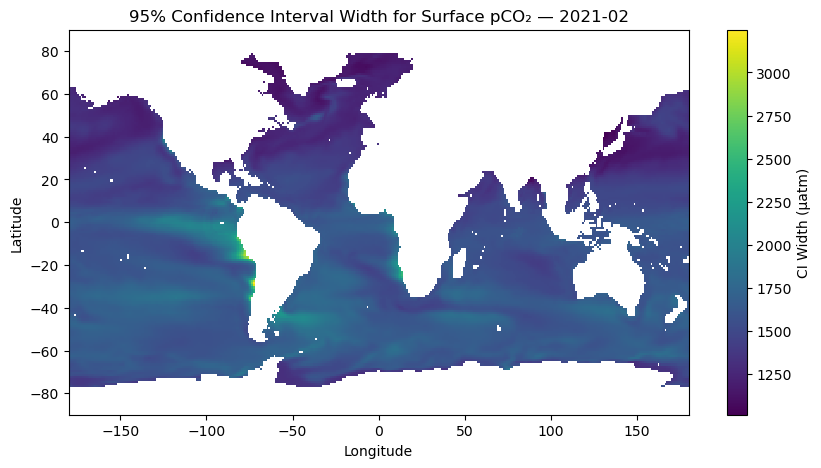

In [249]:
plot_confidence_interval_width(
    mask_name="densify_30p",
    selected_mems_dict=selected_mems_dict,
    output_dir=output_dir,
    init_date=init_date,
    fin_date=fin_date,
    month="2021-02",
)


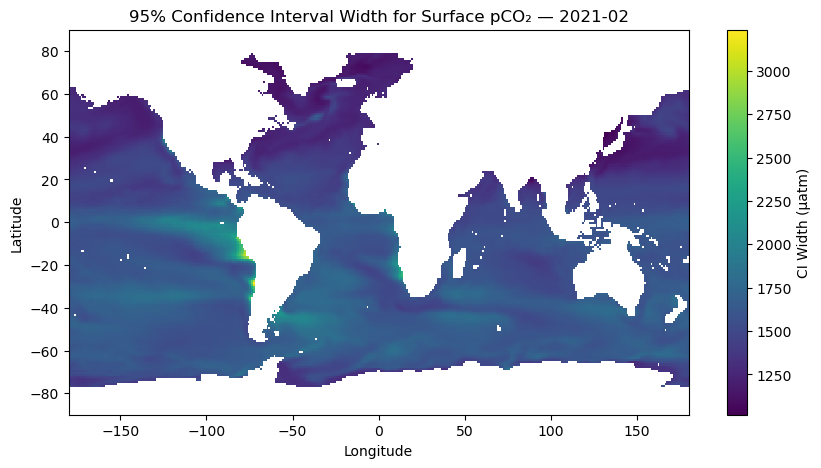

In [261]:
plot_confidence_interval_width(
    mask_name="expand_30p",
    selected_mems_dict=selected_mems_dict,
    output_dir=output_dir,
    init_date=init_date,
    fin_date=fin_date,
    month="2021-02",
)


Loading recon 1: gs://leap-persistent/azamkhan99/azamkhan99/pco2_residual/nmse/post02_xgb/reconstructions/densify_30p/ACCESS-ESM1-5/member_r10i1p1f1/recon_pCO2_ACCESS-ESM1-5_member_r10i1p1f1_mon_1x1_200401_202312.zarr
Loading recon 2: gs://leap-persistent/azamkhan99/azamkhan99/pco2_residual/nmse/post02_xgb/reconstructions/densify_50p/ACCESS-ESM1-5/member_r10i1p1f1/recon_pCO2_ACCESS-ESM1-5_member_r10i1p1f1_mon_1x1_200401_202312.zarr
Calculating time average from 2004-01 to 2023-12 for both reconstructions...


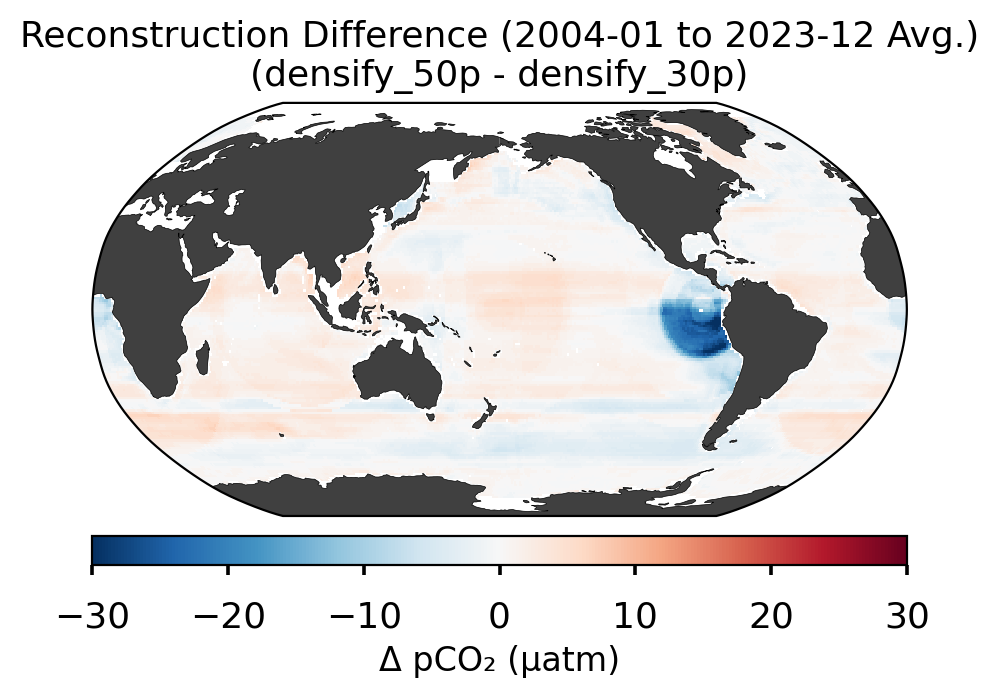

In [50]:
# Ensure necessary libraries are imported
import matplotlib.pyplot as plt
import matplotlib.cm as cm # Keep this specific import
import numpy as np
import xarray as xr
# Assuming SpatialMap2 is defined/imported correctly elsewhere
# from aplotpy import SpatialMap2

def plot_masking_strategy_difference(
    mask_name_1,
    mask_name_2,
    mask_data_dict, # This parameter is not actually used in the function body, but kept for signature consistency
    selected_mems_dict,
    ensemble_dir,
    output_dir,
    dates,            # Not directly used for averaging, but kept for consistency. Assumed recon files cover the period.
    init_date,        # Used for finding recon file path
    fin_date,         # Used for finding recon file path
    # --- MODIFIED PARAMETERS ---
    start_time,       # Start time for averaging (e.g., "2004-01")
    end_time,         # End time for averaging (e.g., "2023-12")
    # --- END MODIFIED PARAMETERS ---
    plot_style="seaborn-v0_8-talk",
    cmap_diff="RdBu_r",  # Colormap as a string
    diff_vrange=[-30, 30],
    # chosen_time is removed, replaced by start_time and end_time
):
    """
    Plot the difference between the time-averaged reconstructions from
    two different masking strategies over a specified period.
    (Modified from original to show difference of time averages)
    """

    # Select the first ensemble and member (original logic kept)
    first_ens = list(selected_mems_dict.keys())[0]
    first_mem = selected_mems_dict[first_ens][0]

    # Construct paths (original logic kept)
    recon_path_1 = f"{output_dir}/reconstructions/{mask_name_1}/{first_ens}/{first_mem}/recon_pCO2_{first_ens}_{first_mem}_mon_1x1_{init_date}_{fin_date}.zarr"
    recon_path_2 = f"{output_dir}/reconstructions/{mask_name_2}/{first_ens}/{first_mem}/recon_pCO2_{first_ens}_{first_mem}_mon_1x1_{init_date}_{fin_date}.zarr"

    print(f"Loading recon 1: {recon_path_1}")
    print(f"Loading recon 2: {recon_path_2}")

    # Load full reconstructed data for the relevant variable
    recon_full_1 = xr.open_zarr(recon_path_1, consolidated=True)["pCO2_recon_full"]
    recon_full_2 = xr.open_zarr(recon_path_2, consolidated=True)["pCO2_recon_full"]

    # --- Select Time Slice and Average ---
    print(f"Calculating time average from {start_time} to {end_time} for both reconstructions...")
    recon_slice_1 = recon_full_1.sel(time=slice(start_time, end_time))
    recon_slice_2 = recon_full_2.sel(time=slice(start_time, end_time))

    recon_avg_1_temporal = recon_slice_1.mean(dim="time", skipna=True)
    recon_avg_2_temporal = recon_slice_2.mean(dim="time", skipna=True)

    # Handle the potential extra dimension (like the original [0, ...]) AFTER averaging
    if len(recon_avg_1_temporal.dims) > 2:
        print(f"Selecting index 0 from leading dimension '{recon_avg_1_temporal.dims[0]}' for recon 1 after averaging.")
        recon_1 = recon_avg_1_temporal.isel({recon_avg_1_temporal.dims[0]: 0}, drop=True)
    else:
        recon_1 = recon_avg_1_temporal # Already 2D

    if len(recon_avg_2_temporal.dims) > 2:
        print(f"Selecting index 0 from leading dimension '{recon_avg_2_temporal.dims[0]}' for recon 2 after averaging.")
        recon_2 = recon_avg_2_temporal.isel({recon_avg_2_temporal.dims[0]: 0}, drop=True)
    else:
        recon_2 = recon_avg_2_temporal # Already 2D
    # --- End Time Slice and Average ---

    # Align longitudes (applied to averaged data)
    recon_1 = recon_1.roll(xlon=len(recon_1.xlon) // 2, roll_coords=True)
    recon_2 = recon_2.roll(xlon=len(recon_2.xlon) // 2, roll_coords=True)

    # Calculate the difference between the averages
    diff = recon_2 - recon_1

    # Convert colormap string to colormap object (original logic kept)
    try:
        # matplotlib >= 3.7 prefers this
        cmap_object = plt.colormaps[cmap_diff]
    except AttributeError:
        # Fallback for older matplotlib
        cmap_object = cm.get_cmap(cmap_diff)


    # Start plotting (original logic kept, but uses averaged diff)
    with plt.style.context(plot_style):
        fig = plt.figure(figsize=(6, 3), dpi=200)
        # Ensure SpatialMap2 is correctly imported/defined
        worldmap = SpatialMap2(
            fig=fig,
            region="world",
            cbar_mode="single",
            colorbar=True,
            cbar_location="bottom",
            nrows_ncols=[1, 1],
        )

        sub0 = worldmap.add_plot(
            lon=recon_1["xlon"], # Coordinates from either averaged recon
            lat=recon_1["ylat"],
            data=diff,           # Plot the difference of the averages
            vrange=diff_vrange,
            cmap=cmap_object,    # Pass the colormap object
            ax=0,
        )

        # Update title to reflect averaging period
        time_title = f"{start_time} to {end_time} Avg."
        worldmap.set_title(
            f"Reconstruction Difference ({time_title})\n({mask_name_2} - {mask_name_1})",
            ax=0,
            fontsize=13,
        )
        colorbar = worldmap.add_colorbar(sub0, ax=0)
        worldmap.set_cbar_xlabel(colorbar, "Δ pCO₂ (µatm)", fontsize=12)

        plt.show()

plot_masking_strategy_difference(
    mask_name_1="densify_30p",
    mask_name_2="densify_50p",
    mask_data_dict=mask_data_dict, 
    selected_mems_dict=selected_mems_dict,
    ensemble_dir=ensemble_dir,
    output_dir=output_dir,
    dates=dates, 
    init_date=init_date,
    fin_date=fin_date,
    start_time="2004-01",
    end_time="2023-12",
)

In [49]:
import matplotlib.pyplot as plt

# --- 在调用你的绘图函数之前 ---
plt.close('all') # 关闭所有之前打开的 Matplotlib Figures



Loading recon 1: gs://leap-persistent/azamkhan99/azamkhan99/pco2_residual/nmse/post02_xgb/reconstructions/baseline/ACCESS-ESM1-5/member_r10i1p1f1/recon_pCO2_ACCESS-ESM1-5_member_r10i1p1f1_mon_1x1_200401_202312.zarr
Loading recon 2: gs://leap-persistent/azamkhan99/azamkhan99/pco2_residual/nmse/post02_xgb/reconstructions/densify_50p/ACCESS-ESM1-5/member_r10i1p1f1/recon_pCO2_ACCESS-ESM1-5_member_r10i1p1f1_mon_1x1_200401_202312.zarr
Calculating time average from 2004-01 to 2023-12 for both reconstructions...


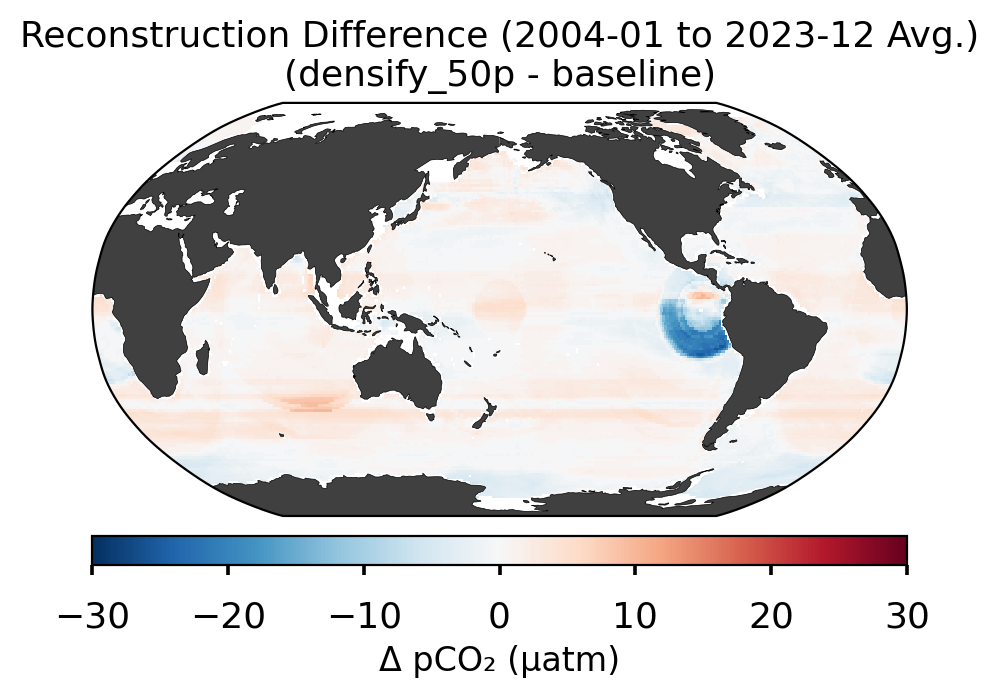

In [52]:
plot_masking_strategy_difference(
    mask_name_1="baseline",
    mask_name_2="densify_50p",
    mask_data_dict=mask_data_dict, 
    selected_mems_dict=selected_mems_dict,
    ensemble_dir=ensemble_dir,
    output_dir=output_dir,
    dates=dates, 
    init_date=init_date,
    fin_date=fin_date,
    start_time="2004-01",
    end_time="2023-12",
)

Loading recon 1: gs://leap-persistent/azamkhan99/azamkhan99/pco2_residual/nmse/post02_xgb/reconstructions/baseline/ACCESS-ESM1-5/member_r10i1p1f1/recon_pCO2_ACCESS-ESM1-5_member_r10i1p1f1_mon_1x1_200401_202312.zarr
Loading recon 2: gs://leap-persistent/azamkhan99/azamkhan99/pco2_residual/nmse/post02_xgb/reconstructions/densify_30p/ACCESS-ESM1-5/member_r10i1p1f1/recon_pCO2_ACCESS-ESM1-5_member_r10i1p1f1_mon_1x1_200401_202312.zarr
Calculating time average from 2004-01 to 2023-12 for both reconstructions...


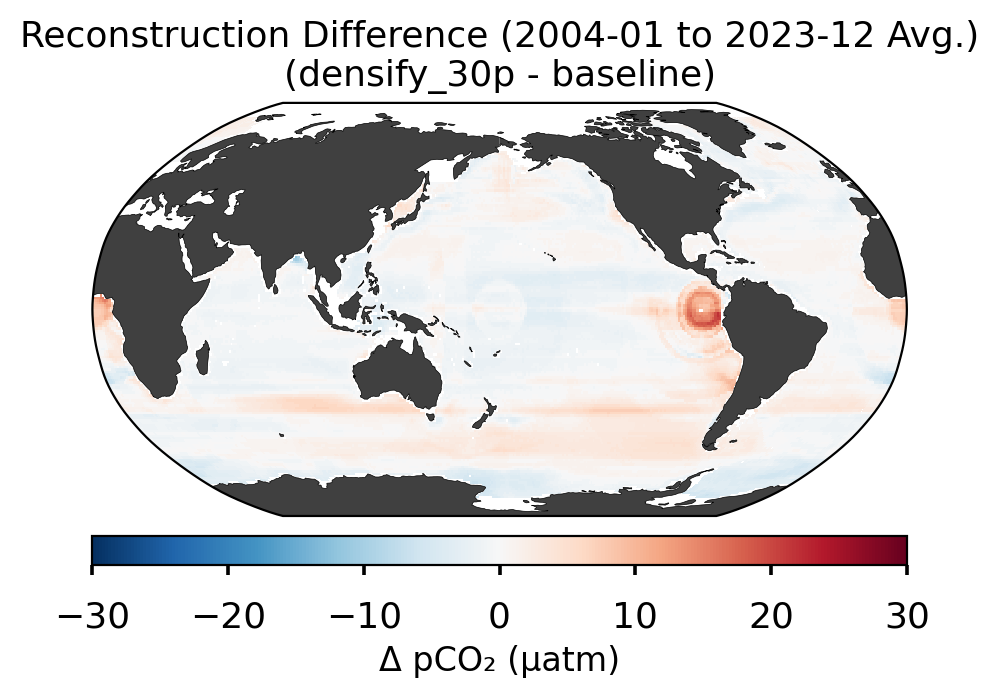

In [58]:
plot_masking_strategy_difference(
    mask_name_1="baseline",
    mask_name_2="densify_30p",
    mask_data_dict=mask_data_dict, 
    selected_mems_dict=selected_mems_dict,
    ensemble_dir=ensemble_dir,
    output_dir=output_dir,
    dates=dates, 
    init_date=init_date,
    fin_date=fin_date,
    start_time="2004-01",
    end_time="2023-12",
)

Loading recon 1: gs://leap-persistent/azamkhan99/azamkhan99/pco2_residual/nmse/post02_xgb/reconstructions/baseline/ACCESS-ESM1-5/member_r10i1p1f1/recon_pCO2_ACCESS-ESM1-5_member_r10i1p1f1_mon_1x1_200401_202312.zarr
Loading recon 2: gs://leap-persistent/azamkhan99/azamkhan99/pco2_residual/nmse/post02_xgb/reconstructions/densify_mean_pattern/ACCESS-ESM1-5/member_r10i1p1f1/recon_pCO2_ACCESS-ESM1-5_member_r10i1p1f1_mon_1x1_200401_202312.zarr
Calculating time average from 2004-01 to 2023-12 for both reconstructions...


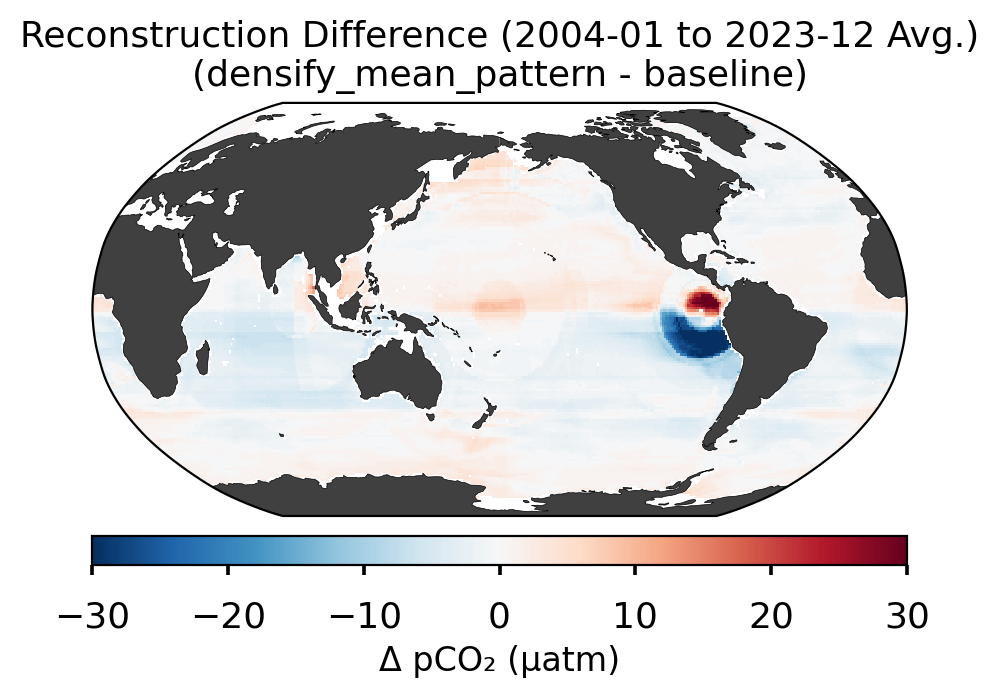

In [59]:
plot_masking_strategy_difference(
    mask_name_1="baseline",
    mask_name_2="densify_mean_pattern",
    mask_data_dict=mask_data_dict, 
    selected_mems_dict=selected_mems_dict,
    ensemble_dir=ensemble_dir,
    output_dir=output_dir,
    dates=dates, 
    init_date=init_date,
    fin_date=fin_date,
    start_time="2004-01",
    end_time="2023-12",
)

Loading recon 1: gs://leap-persistent/azamkhan99/azamkhan99/pco2_residual/nmse/post02_xgb/reconstructions/baseline/ACCESS-ESM1-5/member_r10i1p1f1/recon_pCO2_ACCESS-ESM1-5_member_r10i1p1f1_mon_1x1_200401_202312.zarr
Loading recon 2: gs://leap-persistent/azamkhan99/azamkhan99/pco2_residual/nmse/post02_xgb/reconstructions/expand_14p/ACCESS-ESM1-5/member_r10i1p1f1/recon_pCO2_ACCESS-ESM1-5_member_r10i1p1f1_mon_1x1_200401_202312.zarr
Calculating time average from 2004-01 to 2023-12 for both reconstructions...


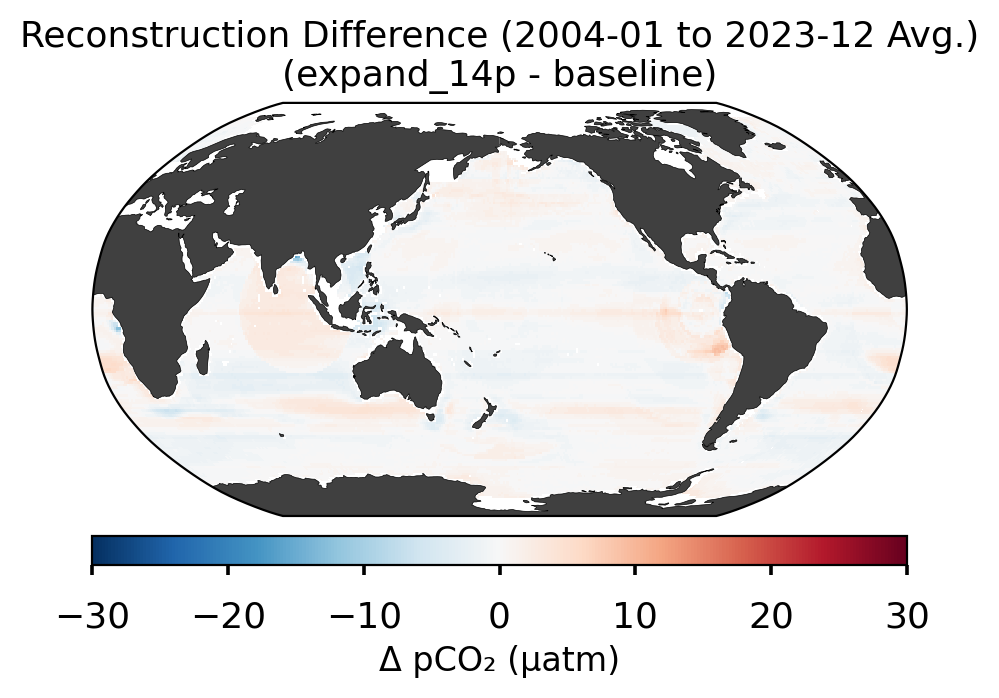

In [60]:
plot_masking_strategy_difference(
    mask_name_1="baseline",
    mask_name_2="expand_14p",
    mask_data_dict=mask_data_dict, 
    selected_mems_dict=selected_mems_dict,
    ensemble_dir=ensemble_dir,
    output_dir=output_dir,
    dates=dates, 
    init_date=init_date,
    fin_date=fin_date,
    start_time="2004-01",
    end_time="2023-12",
)

Loading recon 1: gs://leap-persistent/azamkhan99/azamkhan99/pco2_residual/nmse/post02_xgb/reconstructions/baseline/ACCESS-ESM1-5/member_r10i1p1f1/recon_pCO2_ACCESS-ESM1-5_member_r10i1p1f1_mon_1x1_200401_202312.zarr
Loading recon 2: gs://leap-persistent/azamkhan99/azamkhan99/pco2_residual/nmse/post02_xgb/reconstructions/expand_30p/ACCESS-ESM1-5/member_r10i1p1f1/recon_pCO2_ACCESS-ESM1-5_member_r10i1p1f1_mon_1x1_200401_202312.zarr
Calculating time average from 2004-01 to 2023-12 for both reconstructions...


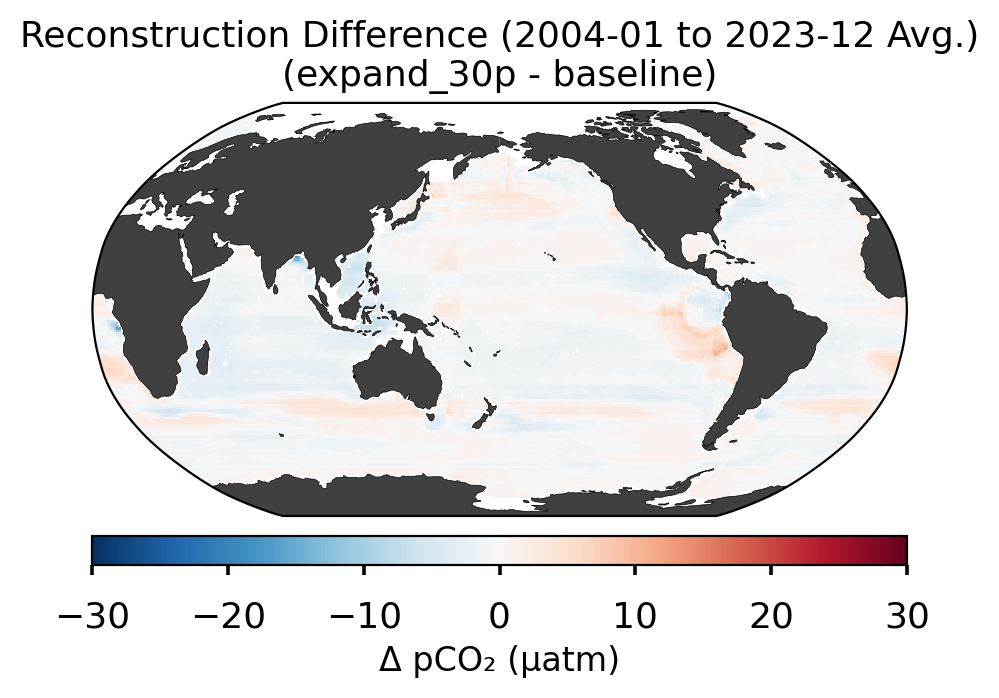

In [61]:
plot_masking_strategy_difference(
    mask_name_1="baseline",
    mask_name_2="expand_30p",
    mask_data_dict=mask_data_dict, 
    selected_mems_dict=selected_mems_dict,
    ensemble_dir=ensemble_dir,
    output_dir=output_dir,
    dates=dates, 
    init_date=init_date,
    fin_date=fin_date,
    start_time="2004-01",
    end_time="2023-12",
)

Loading recon 1: gs://leap-persistent/azamkhan99/azamkhan99/pco2_residual/nmse/post02_xgb/reconstructions/baseline/ACCESS-ESM1-5/member_r10i1p1f1/recon_pCO2_ACCESS-ESM1-5_member_r10i1p1f1_mon_1x1_200401_202312.zarr
Loading recon 2: gs://leap-persistent/azamkhan99/azamkhan99/pco2_residual/nmse/post02_xgb/reconstructions/expand_50p/ACCESS-ESM1-5/member_r10i1p1f1/recon_pCO2_ACCESS-ESM1-5_member_r10i1p1f1_mon_1x1_200401_202312.zarr
Calculating time average from 2004-01 to 2023-12 for both reconstructions...


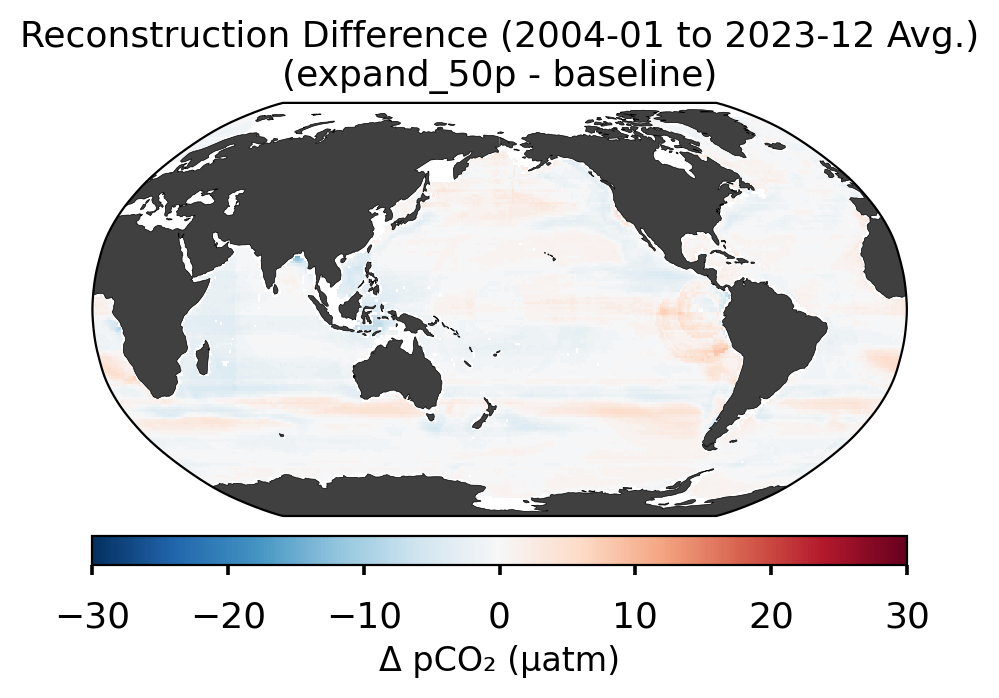

In [62]:
plot_masking_strategy_difference(
    mask_name_1="baseline",
    mask_name_2="expand_50p",
    mask_data_dict=mask_data_dict, 
    selected_mems_dict=selected_mems_dict,
    ensemble_dir=ensemble_dir,
    output_dir=output_dir,
    dates=dates, 
    init_date=init_date,
    fin_date=fin_date,
    start_time="2004-01",
    end_time="2023-12",
)

/tmp/ipykernel_79/3435937787.py:24: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_mask = cm.get_cmap(cmap_mask)
/tmp/ipykernel_79/3435937787.py:25: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_diff = cm.get_cmap(cmap_diff)


No member dimension found for baseline, taking time mean.
No member dimension found for expand_50p, taking time mean.


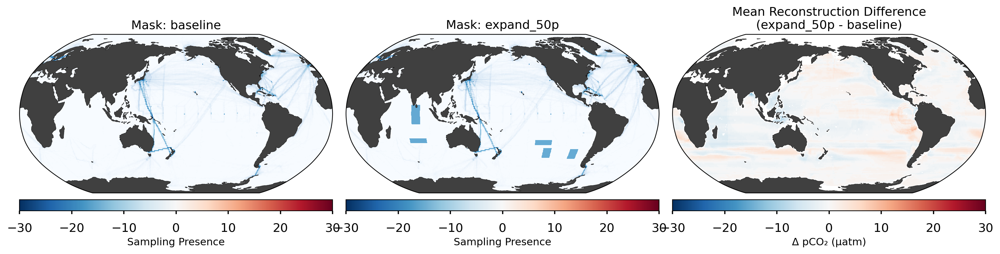

In [78]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np
import xarray as xr


def plot_mean_comparison_panel(
    mask_name_1,
    mask_name_2,
    mask_data_dict,
    selected_mems_dict,
    ensemble_dir,
    output_dir,
    dates,
    init_date,
    fin_date,
    mask_vrange=[0, 1],
    diff_vrange=[-30, 30],
    cmap_mask="Blues",
    cmap_diff="RdBu_r",
    plot_style="seaborn-v0_8-talk",
):

    cmap_mask = cm.get_cmap(cmap_mask)
    cmap_diff = cm.get_cmap(cmap_diff)

 
    first_ens = list(selected_mems_dict.keys())[0]
    first_mem = selected_mems_dict[first_ens][0]
    mask1 = mask_data_dict[mask_name_1]["socat_mask"].mean(dim="time")
    mask2 = mask_data_dict[mask_name_2]["socat_mask"].mean(dim="time")
    recon_path_1 = f"{output_dir}/reconstructions/{mask_name_1}/{first_ens}/{first_mem}/recon_pCO2_{first_ens}_{first_mem}_mon_1x1_{init_date}_{fin_date}.zarr"
    recon_path_2 = f"{output_dir}/reconstructions/{mask_name_2}/{first_ens}/{first_mem}/recon_pCO2_{first_ens}_{first_mem}_mon_1x1_{init_date}_{fin_date}.zarr"



  
    # Load reconstructions and calculate the mean over time

    recon1_full = xr.open_zarr(recon_path_1, consolidated=True)["pCO2_recon_full"]
    recon2_full = xr.open_zarr(recon_path_2, consolidated=True)["pCO2_recon_full"]

    # Check if the loaded data *still* has a member dimension (e.g. if only 1 member)

    member_dim_name = 'member' # Or 'ensemble', 'n_members' etc. - check your data

    if member_dim_name in recon1_full.dims and recon1_full.dims[member_dim_name] > 1:
        # If multiple members exist, average over time first, then select the first member
        print(f"Selecting first member for {mask_name_1} after time mean.")
        recon1 = recon1_full.mean(dim="time").isel({member_dim_name: 0})
    elif member_dim_name in recon1_full.dims and recon1_full.dims[member_dim_name] == 1:
         # If member dim exists but size 1, average time and squeeze it out
        print(f"Squeezing single member dim for {mask_name_1} after time mean.")
        recon1 = recon1_full.mean(dim="time").squeeze(dim=member_dim_name, drop=True)
    else:
        # If no member dimension, just average over time
        print(f"No member dimension found for {mask_name_1}, taking time mean.")
        recon1 = recon1_full.mean(dim="time")

    # Repeat for recon2
    if member_dim_name in recon2_full.dims and recon2_full.dims[member_dim_name] > 1:
        print(f"Selecting first member for {mask_name_2} after time mean.")
        recon2 = recon2_full.mean(dim="time").isel({member_dim_name: 0})
    elif member_dim_name in recon2_full.dims and recon2_full.dims[member_dim_name] == 1:
        print(f"Squeezing single member dim for {mask_name_2} after time mean.")
        recon2 = recon2_full.mean(dim="time").squeeze(dim=member_dim_name, drop=True)
    else:
        print(f"No member dimension found for {mask_name_2}, taking time mean.")
        recon2 = recon2_full.mean(dim="time")

  


    # Align longitude (roll at 180°) - added checks for safety
    if 'xlon' in mask1.dims:
        mask1 = mask1.roll(xlon=len(mask1.xlon) // 2, roll_coords=True)
    if 'xlon' in mask2.dims:
        mask2 = mask2.roll(xlon=len(mask2.xlon) // 2, roll_coords=True)
    if 'xlon' in recon1.dims:
        recon1 = recon1.roll(xlon=len(recon1.xlon) // 2, roll_coords=True)
    if 'xlon' in recon2.dims:
        recon2 = recon2.roll(xlon=len(recon2.xlon) // 2, roll_coords=True)

    # Difference in mean reconstructions
    diff = recon2 - recon1

    # --- Plotting code remains the same ---
    with plt.style.context(plot_style):
        fig = plt.figure(figsize=(15, 4), dpi=200)
        try:
            worldmap = SpatialMap2(
                fig=fig,
                region="world",
                cbar_mode="each",
                colorbar=True,
                cbar_location="bottom",
                nrows_ncols=[1, 3],
            )
        except NameError:
             print("Error: SpatialMap2 class not defined. Plotting cannot proceed.")
             return

        # Left: mean sampling mask 1
        sub0 = worldmap.add_plot(
            lon=mask1["xlon"], lat=mask1["ylat"], data=mask1,
            vrange=mask_vrange, cmap=cmap_mask, ax=0,
        )
        worldmap.set_title(f"Mask: {mask_name_1}", ax=0, fontsize=13)

        # Center: mean sampling mask 2
        sub1 = worldmap.add_plot(
            lon=mask2["xlon"], lat=mask2["ylat"], data=mask2,
            vrange=mask_vrange, cmap=cmap_mask, ax=1,
        )
        worldmap.set_title(f"Mask: {mask_name_2}", ax=1, fontsize=13)

        # Right: difference in mean reconstruction
        sub2 = worldmap.add_plot(
            lon=diff["xlon"], lat=diff["ylat"], data=diff,
            vrange=diff_vrange, cmap=cmap_diff, ax=2,
        )
        worldmap.set_title(
            f"Mean Reconstruction Difference\n({mask_name_2} - {mask_name_1})",
            ax=2, fontsize=13,
        )

        # Colorbars
        cbar0 = worldmap.add_colorbar(sub0, ax=0)
        cbar1 = worldmap.add_colorbar(sub1, ax=1)
        cbar2 = worldmap.add_colorbar(sub2, ax=2)

        worldmap.set_cbar_xlabel(cbar0, "Sampling Presence", fontsize=11)
        worldmap.set_cbar_xlabel(cbar1, "Sampling Presence", fontsize=11)
        worldmap.set_cbar_xlabel(cbar2, "Δ pCO₂ (µatm)", fontsize=11)

        plt.tight_layout()
        plt.show()

# Call
plot_mean_comparison_panel(
    mask_name_1="baseline",
    mask_name_2="expand_50p",
    mask_data_dict=mask_data_dict,        
    selected_mems_dict=selected_mems_dict,
    ensemble_dir=ensemble_dir,             
    output_dir=output_dir,                 
    dates=dates,                           
    init_date=init_date,                  
    fin_date=fin_date,                     
)

/tmp/ipykernel_79/3435937787.py:24: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_mask = cm.get_cmap(cmap_mask)
/tmp/ipykernel_79/3435937787.py:25: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_diff = cm.get_cmap(cmap_diff)


No member dimension found for baseline, taking time mean.
No member dimension found for densify_50p, taking time mean.


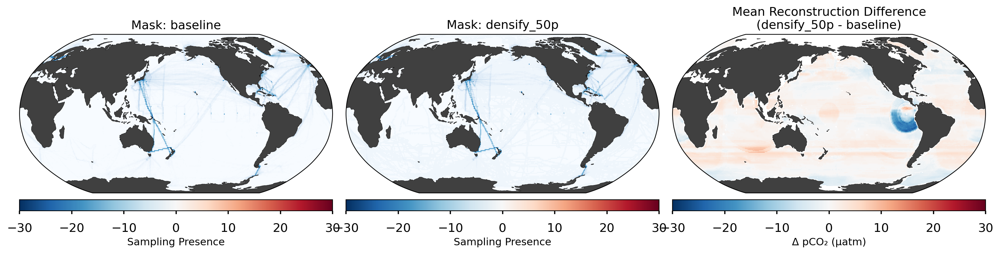

In [80]:
plot_mean_comparison_panel(
    mask_name_1="baseline",
    mask_name_2="densify_50p",
    mask_data_dict=mask_data_dict,        
    selected_mems_dict=selected_mems_dict,
    ensemble_dir=ensemble_dir,             
    output_dir=output_dir,                 
    dates=dates,                           
    init_date=init_date,                  
    fin_date=fin_date,                     
)

/tmp/ipykernel_79/1905989420.py:35: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_mask = cm.get_cmap(cmap_mask)
/tmp/ipykernel_79/1905989420.py:36: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_diff = cm.get_cmap(cmap_diff)


Loading full time series data...
Loading Zarr: gs://leap-persistent/azamkhan99/azamkhan99/pco2_residual/nmse/post02_xgb/reconstructions/baseline/ACCESS-ESM1-5/member_r10i1p1f1/recon_pCO2_ACCESS-ESM1-5_member_r10i1p1f1_mon_1x1_200401_202312.zarr
Loading Zarr: gs://leap-persistent/azamkhan99/azamkhan99/pco2_residual/nmse/post02_xgb/reconstructions/expand_50p/ACCESS-ESM1-5/member_r10i1p1f1/recon_pCO2_ACCESS-ESM1-5_member_r10i1p1f1_mon_1x1_200401_202312.zarr
No member dimension found or needed for baseline.
No member dimension found or needed for expand_50p.
Calculating seasonal means...
Aligning longitudes...
Generating seasonal plots...
  Plotting season: DJF
  Plotting season: MAM
  Plotting season: JJA
  Plotting season: SON


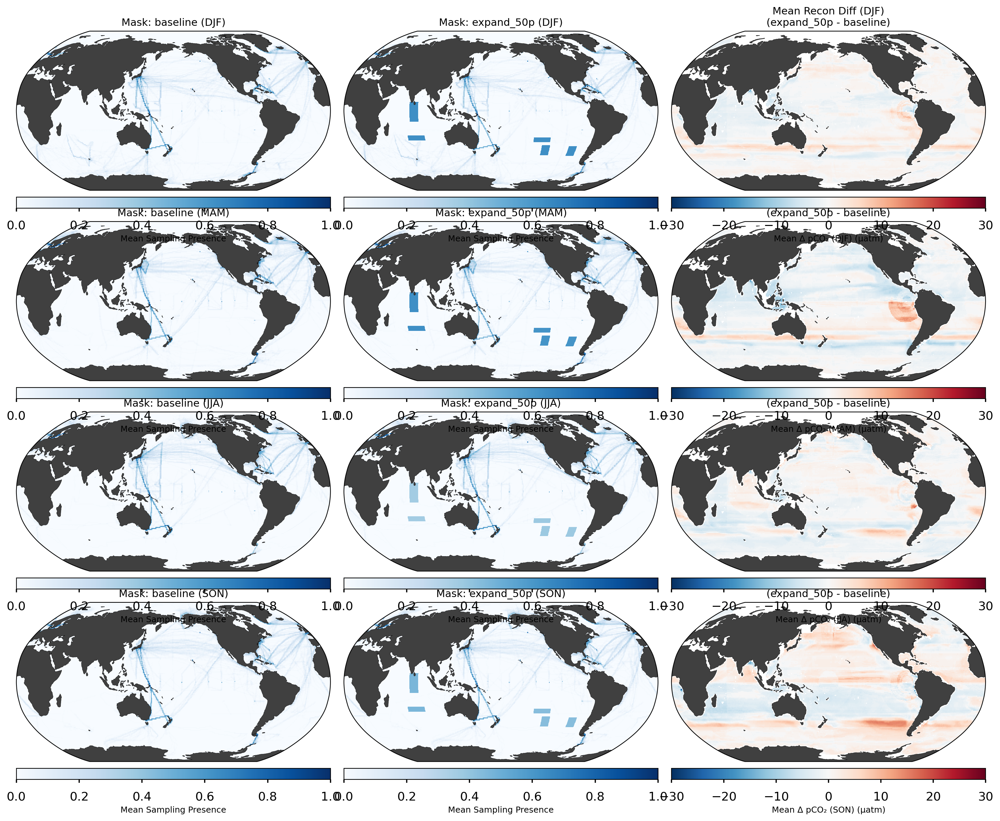

Plotting complete.


In [79]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np
import xarray as xr
import pandas as pd # Ensure pandas is imported for date handling if needed elsewhere

# Assuming SpatialMap2 is defined elsewhere or imported
# Make sure it can handle multi-row layouts if you use it directly
# Example dummy class provided if needed for testing:
# class SpatialMap2: ... (as provided before)


def plot_seasonal_comparison_panel( # Renamed function
    mask_name_1,
    mask_name_2,
    mask_data_dict,
    selected_mems_dict,
    ensemble_dir,
    output_dir,
    # dates, init_date, fin_date are now less directly used for calculation,
    # but kept for consistency if file paths depend on them
    init_date,
    fin_date,
    mask_vrange=[0, 1],
    diff_vrange=[-30, 30],
    cmap_mask="Blues",
    cmap_diff="RdBu_r",
    plot_style="seaborn-v0_8-talk",
):
    """
    Plots a comparison panel showing seasonal means (DJF, MAM, JJA, SON)
    of sampling masks and reconstruction differences.
    """

    cmap_mask = cm.get_cmap(cmap_mask)
    cmap_diff = cm.get_cmap(cmap_diff)

    first_ens = list(selected_mems_dict.keys())[0]
    first_mem = selected_mems_dict[first_ens][0]

    # --- Load FULL Data (Do not average yet) ---
    print("Loading full time series data...")
    # Load full masks
    mask1_full = mask_data_dict[mask_name_1]["socat_mask"]
    mask2_full = mask_data_dict[mask_name_2]["socat_mask"]

    # Load full reconstructions paths
    recon_path_1 = f"{output_dir}/reconstructions/{mask_name_1}/{first_ens}/{first_mem}/recon_pCO2_{first_ens}_{first_mem}_mon_1x1_{init_date}_{fin_date}.zarr"
    recon_path_2 = f"{output_dir}/reconstructions/{mask_name_2}/{first_ens}/{first_mem}/recon_pCO2_{first_ens}_{first_mem}_mon_1x1_{init_date}_{fin_date}.zarr"

    # Load full reconstructions
    print(f"Loading Zarr: {recon_path_1}")
    recon1_full_members = xr.open_zarr(recon_path_1, consolidated=True)["pCO2_recon_full"]
    print(f"Loading Zarr: {recon_path_2}")
    recon2_full_members = xr.open_zarr(recon_path_2, consolidated=True)["pCO2_recon_full"]

    # Handle potential member dimension (select first member)
    member_dim_name = 'member' # Adjust if needed

    # Process recon1
    if member_dim_name in recon1_full_members.dims and recon1_full_members.dims[member_dim_name] > 1:
        print(f"Selecting first member for {mask_name_1}.")
        recon1_full = recon1_full_members.isel({member_dim_name: 0})
    elif member_dim_name in recon1_full_members.dims and recon1_full_members.dims[member_dim_name] == 1:
        print(f"Squeezing single member dim for {mask_name_1}.")
        recon1_full = recon1_full_members.squeeze(dim=member_dim_name, drop=True)
    else:
        print(f"No member dimension found or needed for {mask_name_1}.")
        recon1_full = recon1_full_members # Assume it's already (time, lat, lon)

    # Process recon2
    if member_dim_name in recon2_full_members.dims and recon2_full_members.dims[member_dim_name] > 1:
        print(f"Selecting first member for {mask_name_2}.")
        recon2_full = recon2_full_members.isel({member_dim_name: 0})
    elif member_dim_name in recon2_full_members.dims and recon2_full_members.dims[member_dim_name] == 1:
        print(f"Squeezing single member dim for {mask_name_2}.")
        recon2_full = recon2_full_members.squeeze(dim=member_dim_name, drop=True)
    else:
        print(f"No member dimension found or needed for {mask_name_2}.")
        recon2_full = recon2_full_members

    # --- Calculate Seasonal Means ---
    print("Calculating seasonal means...")
    # Define standard meteorological seasons
    # Note: xarray labels seasons based on the location of the *last* month
    # DJF (Dec, Jan, Feb) -> labeled 'DJF'
    # MAM (Mar, Apr, May) -> labeled 'MAM'
    # JJA (Jun, Jul, Aug) -> labeled 'JJA'
    # SON (Sep, Oct, Nov) -> labeled 'SON'
    seasons_order = ['DJF', 'MAM', 'JJA', 'SON']

    # Group by season and calculate mean over time for each group
    # Use .sel() to ensure the order is DJF, MAM, JJA, SON
    mask1_seasonal = mask1_full.groupby('time.season').mean(dim="time").sel(season=seasons_order)
    mask2_seasonal = mask2_full.groupby('time.season').mean(dim="time").sel(season=seasons_order)
    recon1_seasonal = recon1_full.groupby('time.season').mean(dim="time").sel(season=seasons_order)
    recon2_seasonal = recon2_full.groupby('time.season').mean(dim="time").sel(season=seasons_order)

    # Calculate the difference between the *seasonal means*
    diff_seasonal = recon2_seasonal - recon1_seasonal

    # --- Align Longitude (Roll at 180°) for all seasonal means ---
    # Do this once after seasonal averaging for efficiency
    print("Aligning longitudes...")
    if 'xlon' in mask1_seasonal.dims:
        mask1_seasonal = mask1_seasonal.roll(xlon=len(mask1_seasonal.xlon) // 2, roll_coords=True)
        mask1_seasonal['xlon'] = (mask1_seasonal['xlon'] + 180) % 360 - 180 # Adjust coords to -180 to 180
    if 'xlon' in mask2_seasonal.dims:
        mask2_seasonal = mask2_seasonal.roll(xlon=len(mask2_seasonal.xlon) // 2, roll_coords=True)
        mask2_seasonal['xlon'] = (mask2_seasonal['xlon'] + 180) % 360 - 180
    if 'xlon' in recon1_seasonal.dims:
        recon1_seasonal = recon1_seasonal.roll(xlon=len(recon1_seasonal.xlon) // 2, roll_coords=True)
        recon1_seasonal['xlon'] = (recon1_seasonal['xlon'] + 180) % 360 - 180
    if 'xlon' in recon2_seasonal.dims:
        recon2_seasonal = recon2_seasonal.roll(xlon=len(recon2_seasonal.xlon) // 2, roll_coords=True)
        recon2_seasonal['xlon'] = (recon2_seasonal['xlon'] + 180) % 360 - 180
    if 'xlon' in diff_seasonal.dims:
         diff_seasonal = diff_seasonal.roll(xlon=len(diff_seasonal.xlon) // 2, roll_coords=True)
         diff_seasonal['xlon'] = (diff_seasonal['xlon'] + 180) % 360 - 180


    # --- Plotting ---
    print("Generating seasonal plots...")
    with plt.style.context(plot_style):
        # Create a figure with 4 rows (one for each season) and 3 columns
        fig = plt.figure(figsize=(15, 16), dpi=200) # Taller figure

        try:
            # Initialize your map class - ensure it can handle multi-row axes
            worldmap = SpatialMap2(
                fig=fig,
                region="world",
                cbar_mode="each", # One colorbar per plot
                colorbar=True,
                cbar_location="bottom",
                nrows_ncols=[4, 3] # 4 rows, 3 columns
            )
        except NameError:
             print("Error: SpatialMap2 class not defined or imported.")
             print("Plotting cannot proceed without a valid map plotting class.")
             plt.close(fig) # Close the empty figure
             return
        except Exception as e:
             print(f"Error initializing SpatialMap2: {e}")
             plt.close(fig)
             return

        # Loop through each season and plot the corresponding row
        for i, season in enumerate(seasons_order):
            print(f"  Plotting season: {season}")
            # Calculate axis indices for the current row
            ax_idx_mask1 = i * 3 + 0
            ax_idx_mask2 = i * 3 + 1
            ax_idx_diff  = i * 3 + 2

            # Select data for the current season
            mask1_s = mask1_seasonal.sel(season=season)
            mask2_s = mask2_seasonal.sel(season=season)
            diff_s = diff_seasonal.sel(season=season)

            # --- Plotting Column 1: Mask 1 ---
            try:
                sub0 = worldmap.add_plot(
                    lon=mask1_s["xlon"], lat=mask1_s["ylat"], data=mask1_s,
                    vrange=mask_vrange, cmap=cmap_mask, ax=ax_idx_mask1,
                )
                worldmap.set_title(f"Mask: {mask_name_1} ({season})", ax=ax_idx_mask1, fontsize=11) # Smaller font maybe
                cbar0 = worldmap.add_colorbar(sub0, ax=ax_idx_mask1)
                worldmap.set_cbar_xlabel(cbar0, "Mean Sampling Presence", fontsize=9) # Adjusted label
            except Exception as e:
                print(f"Error plotting Mask 1 for {season}: {e}")
                worldmap.set_title(f"Mask: {mask_name_1} ({season})\nPLOT ERROR", ax=ax_idx_mask1, fontsize=11)


            # --- Plotting Column 2: Mask 2 ---
            try:
                sub1 = worldmap.add_plot(
                    lon=mask2_s["xlon"], lat=mask2_s["ylat"], data=mask2_s,
                    vrange=mask_vrange, cmap=cmap_mask, ax=ax_idx_mask2,
                )
                worldmap.set_title(f"Mask: {mask_name_2} ({season})", ax=ax_idx_mask2, fontsize=11)
                cbar1 = worldmap.add_colorbar(sub1, ax=ax_idx_mask2)
                worldmap.set_cbar_xlabel(cbar1, "Mean Sampling Presence", fontsize=9) # Adjusted label
            except Exception as e:
                 print(f"Error plotting Mask 2 for {season}: {e}")
                 worldmap.set_title(f"Mask: {mask_name_2} ({season})\nPLOT ERROR", ax=ax_idx_mask2, fontsize=11)


            # --- Plotting Column 3: Difference ---
            try:
                sub2 = worldmap.add_plot(
                    lon=diff_s["xlon"], lat=diff_s["ylat"], data=diff_s,
                    vrange=diff_vrange, cmap=cmap_diff, ax=ax_idx_diff,
                )
                worldmap.set_title(
                    f"Mean Recon Diff ({season})\n({mask_name_2} - {mask_name_1})", # Adjusted title
                    ax=ax_idx_diff, fontsize=11,
                )
                cbar2 = worldmap.add_colorbar(sub2, ax=ax_idx_diff)
                # Adjust label size if needed
                worldmap.set_cbar_xlabel(cbar2, f"Mean Δ pCO₂ ({season}) (µatm)", fontsize=9) # Adjusted label
            except Exception as e:
                 print(f"Error plotting Difference for {season}: {e}")
                 worldmap.set_title(f"Mean Recon Diff ({season})\nPLOT ERROR", ax=ax_idx_diff, fontsize=11)


        # Adjust layout to prevent overlap, especially with titles and bottom colorbars
        plt.tight_layout(rect=[0, 0.05, 1, 0.97]) # May need fine-tuning (rect=[left, bottom, right, top])
        # Or try subplots_adjust
        #plt.subplots_adjust(hspace=0.4, wspace=0.1, bottom=0.15) # Example values

        plt.show()
        print("Plotting complete.")


# --- Example Call ---
# Make sure all the input variables (mask_data_dict, selected_mems_dict, etc.)
# are defined correctly and contain data with a proper time dimension.
# Also ensure SpatialMap2 is defined/imported.

plot_seasonal_comparison_panel(
    mask_name_1="baseline",
    mask_name_2="expand_50p",
    mask_data_dict=mask_data_dict,
    selected_mems_dict=selected_mems_dict,
    ensemble_dir=ensemble_dir,
    output_dir=output_dir,
    init_date=init_date, 
    fin_date=fin_date,   
)

/tmp/ipykernel_79/1905989420.py:35: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_mask = cm.get_cmap(cmap_mask)
/tmp/ipykernel_79/1905989420.py:36: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_diff = cm.get_cmap(cmap_diff)


Loading full time series data...
Loading Zarr: gs://leap-persistent/azamkhan99/azamkhan99/pco2_residual/nmse/post02_xgb/reconstructions/baseline/ACCESS-ESM1-5/member_r10i1p1f1/recon_pCO2_ACCESS-ESM1-5_member_r10i1p1f1_mon_1x1_200401_202312.zarr
Loading Zarr: gs://leap-persistent/azamkhan99/azamkhan99/pco2_residual/nmse/post02_xgb/reconstructions/densify_50p/ACCESS-ESM1-5/member_r10i1p1f1/recon_pCO2_ACCESS-ESM1-5_member_r10i1p1f1_mon_1x1_200401_202312.zarr
No member dimension found or needed for baseline.
No member dimension found or needed for densify_50p.
Calculating seasonal means...
Aligning longitudes...
Generating seasonal plots...
  Plotting season: DJF
  Plotting season: MAM
  Plotting season: JJA
  Plotting season: SON


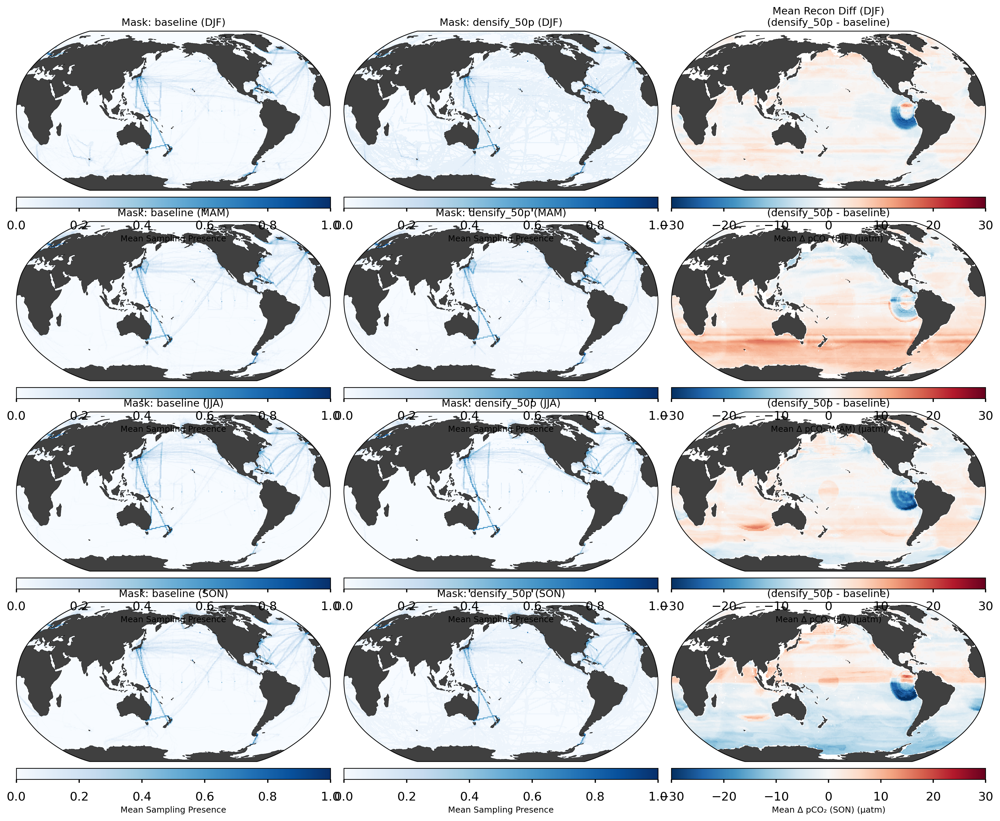

Plotting complete.


In [81]:
plot_seasonal_comparison_panel(
    mask_name_1="baseline",
    mask_name_2="densify_50p",
    mask_data_dict=mask_data_dict,
    selected_mems_dict=selected_mems_dict,
    ensemble_dir=ensemble_dir,
    output_dir=output_dir,
    init_date=init_date, 
    fin_date=fin_date,   
)

/tmp/ipykernel_79/1905989420.py:35: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_mask = cm.get_cmap(cmap_mask)
/tmp/ipykernel_79/1905989420.py:36: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_diff = cm.get_cmap(cmap_diff)


Loading full time series data...
Loading Zarr: gs://leap-persistent/azamkhan99/azamkhan99/pco2_residual/nmse/post02_xgb/reconstructions/baseline/ACCESS-ESM1-5/member_r10i1p1f1/recon_pCO2_ACCESS-ESM1-5_member_r10i1p1f1_mon_1x1_200401_202312.zarr
Loading Zarr: gs://leap-persistent/azamkhan99/azamkhan99/pco2_residual/nmse/post02_xgb/reconstructions/densify_mean_pattern/ACCESS-ESM1-5/member_r10i1p1f1/recon_pCO2_ACCESS-ESM1-5_member_r10i1p1f1_mon_1x1_200401_202312.zarr
No member dimension found or needed for baseline.
No member dimension found or needed for densify_mean_pattern.
Calculating seasonal means...
Aligning longitudes...
Generating seasonal plots...
  Plotting season: DJF
  Plotting season: MAM
  Plotting season: JJA
  Plotting season: SON


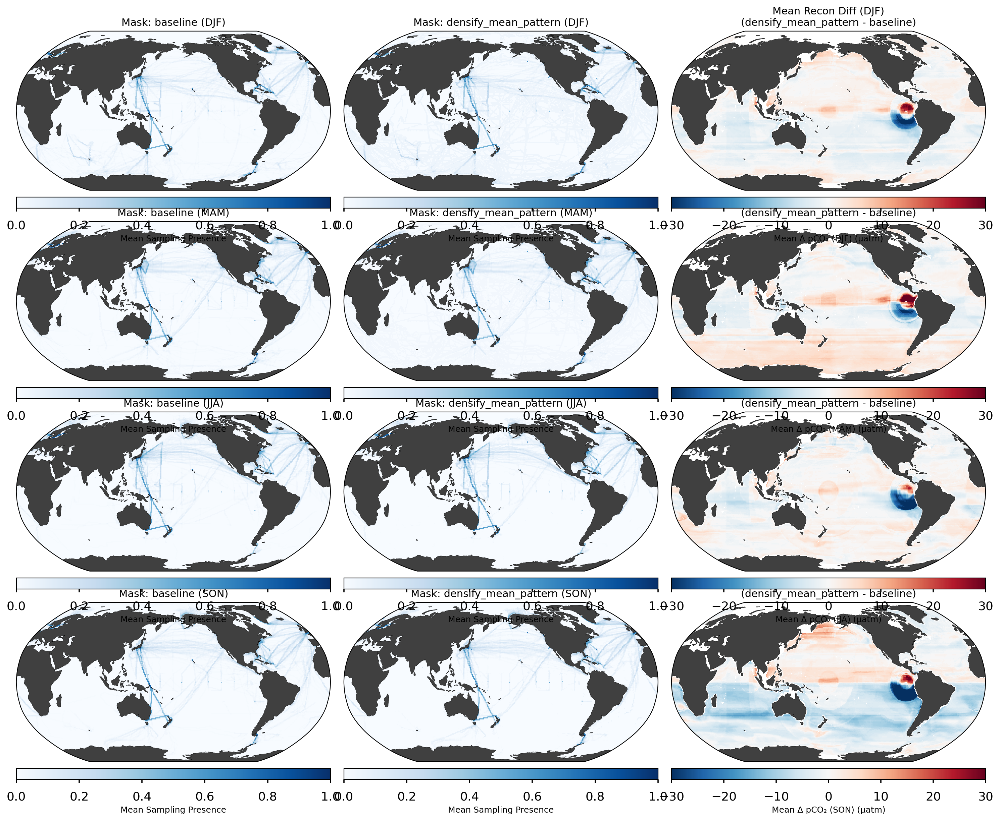

Plotting complete.


In [82]:
plot_seasonal_comparison_panel(
    mask_name_1="baseline",
    mask_name_2="densify_mean_pattern",
    mask_data_dict=mask_data_dict,
    selected_mems_dict=selected_mems_dict,
    ensemble_dir=ensemble_dir,
    output_dir=output_dir,
    init_date=init_date, 
    fin_date=fin_date,   
)